In [1]:
import numpy as np
import pylab as plt
#from numpy import fft
import healpy as hp
from astropy.cosmology import Planck15, default_cosmology
from astropy import constants as const
from astropy import units as un
from astropy.coordinates import SkyCoord
import h5py
from scipy import signal
from astropy.io import ascii, fits

fft = np.fft.fft
fft2 = np.fft.fft2
ifft2 = np.fft.ifft2
fftshift = np.fft.fftshift
ifftshift = np.fft.ifftshift

## Defining the cosmology - Planck15 of astropy 
cosmo = Planck15
f21 = 1420.405752 * un.MHz # MHz
c = const.c.value # m/s
print('The 21 cm line emission freq - ',f21)

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.
The 21 cm line emission freq -  1420.405752 MHz


In [2]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
from matplotlib.colors import LogNorm
%matplotlib inline

plt.rc('font', family='serif', weight='normal', size=22.0)
# plt.rc('xtick', labelsize='x-small')
# plt.rc('ytick', labelsize='x-small')

import copy
COLORMAP = copy.copy(matplotlib.cm.__dict__["inferno"])
COLORMAP.set_under("black")
COLORMAP.set_bad("lightgray")

In [3]:
import os

In [4]:
def delay_to_kpara(delay, z, cosmo=None):
    """Conver delay in sec unit to k_parallel (comoving 1./Mpc along line of sight).

    Parameters
    ----------
    delay : Astropy Quantity object with units equivalent to time.
        The inteferometric delay observed in units compatible with time.
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to planck2015 year in "little h" units

    Returns
    -------
    kparr : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale parallel to the line of sight probed by the input delay (eta).

    """

    
    if cosmo is None:
        cosmo = default_cosmology.get()
    return (delay * (2 * np.pi * cosmo.H0 * f21 * cosmo.efunc(z))
            / (const.c * (1 + z)**2)).to('1/Mpc')

def kpara_to_delay(kpara, z, cosmo=None):
    """Convert k_parallel (comoving 1/Mpc along line of sight) to delay in sec.

    Parameters
    ----------
    kpara : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale parallel to the line of sight
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    delay : Astropy Quantity units equivalent to time
        The inteferometric delay which probes the spatial scale given by kparr.

    """

    
    if cosmo is None:
        cosmo = default_cosmology.get()
    return (kpara * const.c * (1 + z)**2
            / (2 * np.pi * cosmo.H0 * f21 * cosmo.efunc(z))).to('s')

def kperp_to_u(kperp, z, cosmo=None):
    """Convert comsological k_perpendicular to baseline length u (wavelength unit).

    Parameters
    ----------
    kperp : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale perpendicular to the line of sight.
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    u : float
        The baseline separation of two interferometric antennas in units of
        wavelength which probes the spatial scale given by kperp

    """
    if cosmo is None:
        cosmo = default_cosmology.get()
    return kperp * cosmo.comoving_transverse_distance(z) / (2 * np.pi)

def u_to_kperp(u, z, cosmo=None):
    """Convert baseline length u to k_perpendicular.

    Parameters
    ----------
    u : float
        The baseline separation of two interferometric antennas in units of wavelength
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    kperp : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale perpendicular to the line of sight probed by the baseline length u.

    """
    if cosmo is None:
        cosmo = default_cosmology.get()
    return 2 * np.pi * u / cosmo.comoving_transverse_distance(z)

def get_spatial_kmodes(Nx,Ny,theta_res,edshift):
    """Estimate the spatial fourier k-modes, (kx and ky) and the gridded u,v coordinates.  
    
    Parameteres
    -----------
    Nx : int
     Number of cells along RA or X-axis direction.
    Ny : int
      Number of cells along DEC or Y-axis direction.
    theta_res : float 
      The cell size of the map in radian unit.
    redshift : float
      redshift at the centre of the band.
    
    Returns
    -------
    k_x : np.ndarray[nra]
     spatial fourier modes along X-axis 
    k_y : np.ndarray[nel]
     spatial fourier modes along Y-axis
    u : np.ndarray[nra]
     gridded u-coordinates 
    v : np.ndarray[nel]
     gridded v-coordinates
    """
    DMz = cosmo.comoving_transverse_distance(redshift).value # in Mpc
    dtheta_Mpc =  DMz * theta_res   # res (radian) to Mpc unit
    k_x = 2*np.pi * (np.fft.fftfreq(Nx, d=dtheta_Mpc)) # [Mpc^-1] The kx coordinates along the X-direction
    k_y = 2*np.pi * (np.fft.fftfreq(Ny, d=dtheta_Mpc)) # [Mpc^-1] The ky coordinates along the Y-direction
   
    k_x = np.fft.fftshift(k_x)
    k_y = np.fft.fftshift(k_y)
    
    u = (DMz * k_x)/(2*np.pi)
    v = (DMz * k_y)/(2*np.pi)
    return k_x,k_y, u, v

def jy_per_beam_to_kelvin(freq,beam_area=1.0):
    """Conversion factor from Jy/beam to kelvin unit.
    
    The conversion factor is C = (10**-26 * lambda**2)/(2 * K_boltzmann * omega_PSF), 
    where omega_PSF is the beam area in sr unit.
    
    Parameters
    ----------
    freq : np.ndarray[nfreq]
        frequency in MHz unit
    beam_area : float
        synthesized beam area in sr unit
        
    Returns
    -------
    C : np.ndarray[nfreq]
     The conversion factor from Jy/beam to Kelvin
    """
 
    Jy = 1.0e-26 # W m^-2 Hz^-1
    c = const.c.value # m/s
    wl = c/(freq*1e6) # freq of the map in MHz
    kB = const.k_B.value # Boltzmann Const in J/k (1.38 * 10-23)
    C = (wl**2 * Jy) / (2*kB *beam_area.value)
    return C 

def image_to_uv(data_cube,window=True,window_name ='tukey', alpha=0.5, axes=None):
    """Spatial FFT along RA and DEC axes of the data cube.
    
    Parameters
    ----------
    data_cube : np.ndarray[nfreq,nra,nel]
       The data cube, whose spatial FFT will be computed along RA and DEC axes.
    window : bool.
       If True apply a spatial apodisation function. Default: True.
    window_name : 'Tukey'
       Apply Tukey spatial tapering window. Default: 'Tukey'.
    alpha : float 
       Shape parameter of the Tukey window. 
       0 = rectangular window, 1 = Hann window. We are taking 0.5 (default), which lies in between. 
    axes : Tuple.
      The axes along which to do the 2D Spatial FFT. This is the RA and DEC axex of the data cube. 
      
    Returns
    -------
      data_cube : np.ndarray[nfreq,nra,nel]
         The 2D spatial FFT of the data cube in (u,v) domain.
    """
    from scipy.signal import windows
    FT_norm = 1 / float(np.prod(np.array(data_cube.shape)[list(axes)]))
    print(f"Fourier Norm : {FT_norm}")            
    if window:
        window_func = getattr(windows, window_name)
        w_ra = window_func(data_cube.shape[axes[0]],alpha=alpha)   # taper in the RA direction 
        w_dec = window_func(data_cube.shape[axes[1]],alpha=alpha)  # taper in the DEC direction
        taper_window = np.outer(w_ra[:,np.newaxis],w_dec[np.newaxis,:]) # Make the 2D tapering function by taking the outer product 
        print(f'Taper window shape : {taper_window.shape}')
        data_cube *=  taper_window[np.newaxis,:,:]
              
    uv_map = np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(data_cube, axes=axes), axes=axes), axes=axes)
     
    return uv_map * FT_norm

def get_ps(vis_cube_1, vis_cube_2 , vol_norm_factor):
    """Estimate the cross-correlation of two data cubes,
    and normalize it. If a single data cube is 
    provided, then estimate the auto-correlation.
    
    The data cubes are complex. This will estimate the cross-correlation
    of two complex data cubes and return the real part of that.
    
    Parameters
    ----------
    vis_cube_1 : np.ndarray[nfreq,Nx,Ny]
      complex data cube in (tau,u,v) domain.
    vis_cube_2 : np.ndarray[nfreq,Nx,Ny]
      complex data cube in (tau,u,v) domain. 
    vol_norm_factor : float
      power spectrum normalization factor in [Mpc^3]
    
    Return
    ------
    ps_cube_real: np.ndarray[nfreq,Nx,Ny]
       The real part of the power spectrum
    """
    if vis_cube_1 is None and vis_cube_2 is None:
        raise NameError('Atleast one map must be provided')
      
    if vis_cube_2 is None:
        print('correlate the vis cube with itself')
        ps_cube_real = (np.conj(vis_cube_1) * vis_cube_1).real
        
    else:
        print('correlate the vis cube 1 with vis cube 2')
        ps_cube_real = (vis_cube_1 * np.conj(vis_cube_2)).real
        
    return ps_cube_real*vol_norm_factor

def is_odd(num):
    return num & 0x1

def PS2D(ps_cube,weight_cube,kperp_bins,kpar_bins,kpar,uu,vv,redshift,fold=True):
    """Estimate the cylindrically averaged 2D power spectrum. 
    
     Parameters
     ----------
     ps_cube : np.ndarray[nfreq,nra*nel] 
       The power spectrum array to average in cylindrical bins.
     weight_cube : np.ndarray[nfreq,nra,nel]
       The inverse variance weight, to be used in averaging. 
     kperp_min : float
       The min value of the bin in k-perpendicular direction; unit 1/Mpc 
     kperp_min : float
       The max value of the bin in k-perpendicular direction; unit 1/Mpc 
     kpar : np.ndarray[nfreq]
       The k_parallel array, unit 1/Mpc 
     uu : np.ndarray[nra]
      The u-coordinate in wavelength.
     vv : np.ndarray[nel] 
       The v-coordinate in wavelength.
     redshift : float
       The redshift corresponding to the band center.
     Nbins_2D : int
       The number of bins in k-perpendicualr direction
     log_bins : bool
       Bins in logarithmic space. Default : True. 
            
    Returns
    -------
    ps_2D : np.ndarray[] = 
      The cylindrically avg 2D Power of shape (k_par,k_perp) with unit [K^2 Mpc^3] 
    k_perp : np.array[Nbins_2d]
     The k_perp array after binning.
    k_para : np.array[nfreq//2]
     The k_parallel array, only the positive half. 
    """
    
   
    # Set weights
    
    if weight_cube is not None:
        # Inverse variance weighting, here weight_cube = 1/sigma, so we are squaring it to get variance
        print('Using inverse variance weighting')
        w = weight_cube ** 2 
    else:
        print('Using unit uniform weighting')
        w = np.ones_like(ps_cube) # Unit uniform weight.  
        
        
#     # Choosing the bins
#     if log_bins:
#         print(f'Using logarithmic binning in k_perp between {kperp_min} and {kperp_max}')
#         kp = np.logspace(np.log10(kperp_min), np.log10(kperp_max),Nbins_2D+1) 
#     else:
#         print(f'Using linear binning in k_perp between {kperp_min} and {kperp_max}')
#         kp = np.linspace(kperp_min, kperp_max,Nbins_2D+1)
                                 
    kp = kperp_bins
    # Find the bin indices and determine which radial bin each cell lies in.

    ku = u_to_kperp(uu,redshift) #convert the u-array to fourier modes
    kv = u_to_kperp(vv,redshift) #convert the v-array to fourier modes
    
    ru = np.sqrt(ku.value** 2 + kv.value ** 2) 
    
    # Digitize the bins
    bin_indx = np.digitize(ru, bins=kp) 
    print(bin_indx.shape)
    
    # Define empty list to store the binned 2D PS
    
    ps_2D = []
    ps_2D_err = [] 
    ps_2D_w = []
    
    # Now bin in 2D ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kp)) + 1:
            p = np.nansum(w[:, bin_indx == i] * ps_cube[:, bin_indx == i], axis=1) / np.sum(w[:, bin_indx == i], axis=1)
            p_err = np.sqrt(2 * np.sum(w[:, bin_indx == i] ** 2 * p[:, None] **
                                       2, axis=1) / np.sum(w[:, bin_indx == i], axis=1) ** 2)

            ps_2D.append(p)
            ps_2D_err.append(p_err)
            ps_2D_w.append(np.sum(w[:, bin_indx == i], axis=1))
            
    ps_2D =  np.array(ps_2D).T 
    ps_2D_w =  np.array(ps_2D_w).T
    ps_2D_err = np.array(ps_2D_err).T

    if fold:
        M = len(kpar)
        k_par = kpar[M // 2 + 1:]
        if is_odd(M):
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[:M // 2][::-1]
        else:
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[1:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[1:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[1:M // 2][::-1]

    # Digitize the kpar bins
    bin_indx_kpar = np.digitize(k_par, bins=kpar_bins)
    ps_2d = []
    ps_2d_err = [] 
    ps_2d_w = []
    
    # Now bin in kpar ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kpar_bins)) + 1:
            p = np.nansum(ps2D_w_fold[bin_indx_kpar == i,:] * ps2D_fold[bin_indx_kpar == i,:], axis=0) / np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0)
            
            p_err = np.sqrt(2 * np.sum(ps2D_w_fold[bin_indx_kpar == i,:] ** 2 * p[None,:] **
                                       2, axis=0) / np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0) ** 2)

            ps_2d.append(p)
            ps_2d_err.append(p_err)
            ps_2d_w.append(np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0))
        
    return kp, kpar_bins, np.array(ps_2d), np.array(ps_2d_w), np.array(ps_2d_err)

def PS2D_no_kpar_bin(ps_cube,weight_cube,kperp_min,kperp_max,kpar,uu,vv,redshift,fold=True,
                    Nbins_2D=30,log_bins=False):
    """Estimate the cylindrically averaged 2D power spectrum. 
    
     Parameters
     ----------
     ps_cube : np.ndarray[nfreq,nra*nel] 
       The power spectrum array to average in cylindrical bins.
     weight_cube : np.ndarray[nfreq,nra,nel]
       The inverse variance weight, to be used in averaging. 
     kperp_min : float
       The min value of the bin in k-perpendicular direction; unit 1/Mpc 
     kperp_min : float
       The max value of the bin in k-perpendicular direction; unit 1/Mpc 
     kpar : np.ndarray[nfreq]
       The k_parallel array, unit 1/Mpc 
     uu : np.ndarray[nra]
      The u-coordinate in wavelength.
     vv : np.ndarray[nel] 
       The v-coordinate in wavelength.
     redshift : float
       The redshift corresponding to the band center.
     Nbins_2D : int
       The number of bins in k-perpendicualr direction
     log_bins : bool
       Bins in logarithmic space. Default : True. 
            
    Returns
    -------
    ps_2D : np.ndarray[] = 
      The cylindrically avg 2D Power of shape (k_par,k_perp) with unit [K^2 Mpc^3] 
    k_perp : np.array[Nbins_2d]
     The k_perp array after binning.
    k_para : np.array[nfreq//2]
     The k_parallel array, only the positive half. 
    """
    
   
    # Set weights
    
    if weight_cube is not None:
        # Inverse variance weighting, here weight_cube = 1/sigma, so we are squaring it to get variance
        print('Using inverse variance weighting')
        w = weight_cube ** 2 
    else:
        print('Using unit uniform weighting')
        w = np.ones_like(ps_cube) # Unit uniform weight.  
        
        
    # Choosing the bins
    if log_bins:
        print(f'Using logarithmic binning in k_perp between {kperp_min} and {kperp_max}')
        kp = np.logspace(np.log10(kperp_min), np.log10(kperp_max),Nbins_2D+1) 
    else:
        print(f'Using linear binning in k_perp between {kperp_min} and {kperp_max}')
        kp = np.linspace(kperp_min, kperp_max,Nbins_2D+1)
                                 
   # kp = kperp_bins
    # Find the bin indices and determine which radial bin each cell lies in.

    ku = u_to_kperp(uu,redshift) #convert the u-array to fourier modes
    kv = u_to_kperp(vv,redshift) #convert the v-array to fourier modes
    
    ru = np.sqrt(ku.value** 2 + kv.value ** 2) 
    
    # Digitize the bins
    bin_indx = np.digitize(ru, bins=kp) 
    print(bin_indx.shape)
    
    # Define empty list to store the binned 2D PS
    
    ps_2D = []
    ps_2D_err = [] 
    ps_2D_w = []
    
    # Now bin in 2D ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kp)) + 1:
            p = np.nansum(w[:, bin_indx == i] * ps_cube[:, bin_indx == i], axis=1) / np.sum(w[:, bin_indx == i], axis=1)
            p_err = np.sqrt(2 * np.sum(w[:, bin_indx == i] ** 2 * p[:, None] **
                                       2, axis=1) / np.sum(w[:, bin_indx == i], axis=1) ** 2)

            ps_2D.append(p)
            ps_2D_err.append(p_err)
            ps_2D_w.append(np.sum(w[:, bin_indx == i], axis=1))
            
    ps_2D =  np.array(ps_2D).T 
    ps_2D_w =  np.array(ps_2D_w).T
    ps_2D_err = np.array(ps_2D_err).T

    if fold:
        M = len(kpar)
        k_par = kpar[M // 2 + 1:]
        if is_odd(M):
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[:M // 2][::-1]
        else:
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[1:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[1:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[1:M // 2][::-1]
            
        return kp, k_par, np.array(ps2D_fold), np.array(ps2D_w_fold), np.array(ps2D_err_fold) 

        
    return kp, kpar, np.array(ps_2d), np.array(ps_2d_w), np.array(ps_2d_err)

def reshape_data_cube(data_cube,u,v,bl_min,bl_max):
    """Keep non-zero visibility cube between min and max baslines (in wavelength unit).
    
    For each delay channel, it will keep the non-zero visibilities between min and max 
    baseline length and flatten the array.
    
    Parameters
    ----------
    data_cube : np.ndarray[nfreq,Nx,Ny]
     The data cube to reshape and flatten.
    u : np.ndarray[Nx]
     The u-coordinates in wavelength unit.
    v : np.ndarray[Ny]
     The v-coordinates in wavelength unit. 
    bl_min : float
     The min baseline length in wavelength unit.
    bl_max : float
     The max baseline length in wavelength unit.
     
    Returns
    -------
    ft_cube : np.ndarray[nfreq,nvis]
     The flatten data cube.
    uu : np.ndarray[nvis]
     The flatten u-coordinates
    vv : np.ndarray[nvis]
     The flatten v-coordinates
    """
    g_uu, g_vv = np.meshgrid(v, u)
    print(f'Gridded data cube shape in kx and ky direction - {g_uu.shape}') 
    g_ru = np.sqrt(g_uu ** 2 + g_vv ** 2)
    bl_idx = (g_ru >= bl_min) & (g_ru <= bl_max)
    uu = g_uu[bl_idx]
    vv = g_vv[bl_idx] 
    
    ft_cube = []
    for ii in range(data_cube.shape[0]):
        ft = data_cube[ii,:,:]
        ft_cube.append(ft[bl_idx].flatten())
        
    return np.array(ft_cube),uu.flatten(), vv.flatten() 

def vol_normalization_vis(Nx,Ny,Nz,theta_res,redshift,chan_width):
    """Estimate the volume normalization factor for the power spectrum.
    
    Parameters
    ----------
    Nx : int
     Number of cells along RA or X-axis direction.
    Ny : int
      Number of cells along DEC or Y-axis direction.
    Nz : int
      Number of samples along freq or Z- axis direction.
    theta_res : float 
      The cell size  in radian unit.
    redshift : float
      redshift at the centre of the band.
    chan_width : float
       channel width in MHz unit.
    
    Returns
    -------
    norm : float
      The  PS normalization factor in Mpc^3 unit
    """
    DMz = cosmo.comoving_transverse_distance(redshift).value # in Mpc
    
    # Along spatial direction 
    dtheta_Mpc =  DMz * theta_res  # res (radian) to Mpc unit
    Lx = (Nx*dtheta_Mpc)  #survey length in RA/X-axis [Mpc]
    Ly = (Ny*dtheta_Mpc) # survey length in DEC/Y-axis [Mpc]
     
    ## Along line-of-sight direction  
    f21 = 1420.405752 * un.MHz # MHz
    c = const.c.to("km/s").value # [km/s]
    Hz = cosmo.H(redshift).value  # [km/s/Mpc]
    d_z = c * (1+redshift)**2 * chan_width / Hz / f21.value  #[Mpc] The sampling interval along the Z line-of-sight dimension Reference: Ref.[liu2014].Eq.(A9)
    Lz = d_z * Nz  #The linear size in z-direction [Mpc]
    

    print(f'Linear size in X-direction = {Lx} Mpc')
    print(f'Linear size in Y-direction = {Ly} Mpc')
    print(f'Linear size in Z-direction = {Lz} Mpc')
    
    norm = (Lx * Ly * Lz)
    print(f'Power Spectrum normalization factor  value - {norm} Mpc^3')
    
    return norm


# Load Data

In [6]:
path = '/project/def-mdobbs/arnab92/SKAD3/data/natural_sub_bands'
data_u = os.path.join(path,'SKA_data_sub_5_166_180.9_MHz.fits')

In [7]:
hdu = fits.open(data_u)[0]

In [8]:
hdr = hdu.header

In [9]:
#hdr

In [10]:
image = np.array(hdu.data[:])

In [11]:
nfreq, Nx, Ny = image.shape

In [12]:
nfreq,Nx, Ny

(150, 2048, 2048)

In [13]:
# Freq array of the data
freq0 = hdr.get('CRVAL3') # First freq channel value in Hz
chan_res = hdr.get('CDELT3') # chan res in Hz
freq = freq0 + chan_res * (np.arange(nfreq)) # The freq array in Hz
print(f"freq range : {freq[0]/1e6} to {freq[-1]/1e6} MHz")
print(f" Chan res : {chan_res/1e6} MHz")

freq range : 166.0 to 180.9 MHz
 Chan res : 0.1 MHz


In [14]:
# Resolution of the image
dx = hdr.get('CDELT1') # pixel size in X-direction, in deg
dy = hdr.get('CDELT2') # pixel size in Y-direction , in deg
print(f'pixel size in X and Y directions are, dx:{abs(dx*3600)} arcsec and dy:{abs(dy*3600)} arcsec')

pixel size in X and Y directions are, dx:15.999999999999984 arcsec and dy:15.999999999999984 arcsec


In [15]:
# freq_start = hdr['CRVAL3']
# df = hdr['CDELT3']
# nf = hdr['NAXIS3']
# freq_end = freq_start + (nf - 1) * df
# fits_freqs = np.linspace(freq_start, freq_end, nf)


In [16]:
DEC_c = hdr.get('CRVAL2')
RA_c = hdr.get('CRVAL1')
cdelta2 = hdr.get('CDELT2')
cdelta1 = hdr.get('CDELT1')
DEC = np.arange((DEC_c-(cdelta2*Ny/2.)) , (DEC_c+(cdelta2*Ny/2.)), cdelta2)
RA = np.arange((RA_c-(cdelta1*Nx/2.)) , (RA_c+(cdelta1*Nx/2.)), cdelta1)

print(f'RA size: {RA.size} and DEC size {DEC.size}')

print(f"RA range : {RA[0]} to {RA[-1]}")
print(f"DEC range : {DEC[0]} to {DEC[-1]}")

RA size: 2048 and DEC size 2048
RA range : 4.551111111111107 to -4.546666666666274
DEC range : -34.551111111111105 to -25.453333333331905


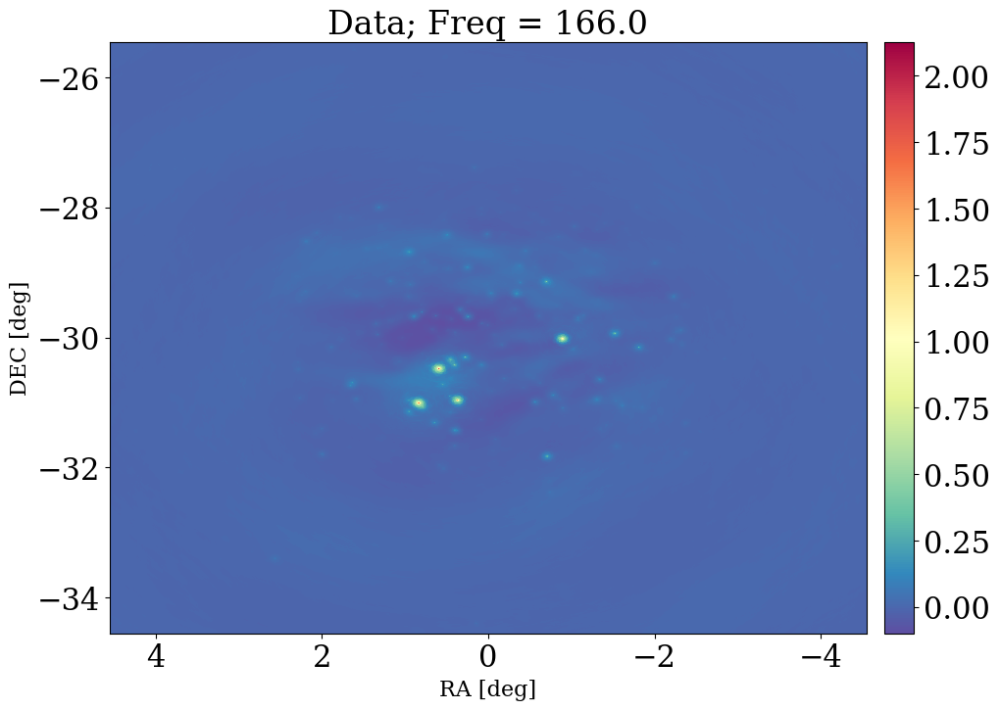

In [17]:
ext=(RA[0],RA[-1], DEC[0], DEC[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext, cmap='Spectral_r')
plt.figure(figsize=(12,8),dpi=100)
nu_id = 0
im = plt.imshow(image[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Data; Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)

In [18]:
print(image.shape)

(150, 2048, 2048)


# Apply PCA 


In [19]:
Im = image.reshape(nfreq,Nx * Ny)
print(Im.shape)

(150, 4194304)


In [20]:
Cov = np.cov(Im) # estimate the freq covariance

In [21]:
print(Cov.shape)

(150, 150)


In [22]:
Cov.min()

0.0002591521640672065

Text(0, 0.5, 'Freq')

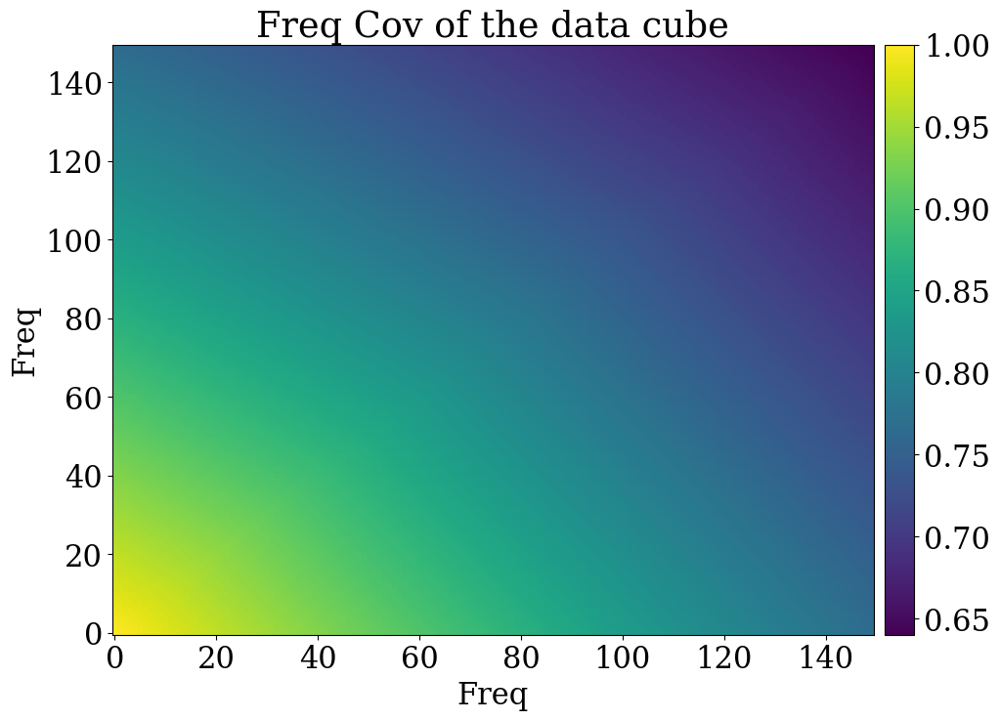

In [23]:
fig = plt.figure(figsize=(12,8),dpi=100)
plt.imshow(Cov/Cov.max(), origin='lower', aspect='auto')
plt.colorbar(pad=0.012)
plt.title('Freq Cov of the data cube')
plt.xlabel('Freq')
plt.ylabel('Freq')

In [24]:
from sklearn.decomposition import FastICA, NMF, KernelPCA, PCA

In [25]:
def pca_fg_filter(data_cube, nfg = 5):
    '''
    This function will estimate the principal components of the data from the freq covariance and remove 
    nfg number of modes, which are dominant by FG emission, i.e, with largest eigenvalues of the covariance matrix. 
    This is PCA fg filter technique. 
    
    Parameters
    ----------
    
    data_cube: the image cube. np.ndarray[freq,ra,el]
    nfg : int, 
          number of eigenmodes to remove from the data. Default: nfg=5
    
    Returns
    -------
    residual_cube: The FG filtered clean cube
    A : The design matrix of shape [nfreq,nfg]. This is the FG operator.
    FG_modes : The FG amplitudes of eigenmodes,  of shape [nfg,nra,el].
    eigvals: The eigenvalues of the freq cov matrix (sorted as largest value first)
    eigvecs: The eigenvectors of the freq cov matrix (sorted as largest value first)
    
    '''
    shp = data_cube.shape # shape of the data cube [nfreq,nRA,nel]
    nfreq, nra, ndec = shp[0], shp[1], shp[2]
    print(f" nfreq :{nfreq}, Nx : {nra}, Ny: {ndec}")
    data = data_cube.reshape(nfreq, nra * ndec) # shaping the data in [nfreq, npix] shape
    
    Cov = np.cov(data) # estimate the freq covariance
    eigvals, eigvecs = np.linalg.eigh(Cov) # eigendecomposition
    
    # Sort by eigenvalue
    idxs = np.argsort(eigvals)[::-1] # reverse order (biggest eigenvalue first)
    eigvals = eigvals[idxs]
    eigvecs = eigvecs[:,idxs]
    
    # Construct the design matrix
    A = eigvecs[:,:nfg] # (Nfreqs, Nmodes)
    
    # The foreground amplitudes for each line of sight
    FG_modes = np.dot(A.T, data) # (Nmodes, Npix)
    
    # Reconstruct the FG map
    
    FG_map = np.dot(A, FG_modes) # Design matrix times FG_modes
    FG_map = FG_map.reshape(nfreq,nra,ndec)
    
    # Subtract the FG map from data
    residual_cube = data_cube - FG_map
    
    return residual_cube, A, FG_modes.reshape(nfg,nra,ndec), eigvals, eigvecs, FG_map
    

In [26]:
Nfg = 15 # Number of FG components to remove

In [27]:
# Apply PCA
clean_cube_pca, design_mat, fg_modes, eigval, eigvec, fg_map = pca_fg_filter(image, nfg = Nfg)

 nfreq :150, Nx : 2048, Ny: 2048


In [28]:
# check the covariance matrix of PCA cleaned data cube
Im_filt = clean_cube_pca.reshape(nfreq,Nx * Ny)
print(Im_filt.shape)
Cov_f = np.cov(Im_filt) # estimate the freq covariance

(150, 4194304)


Text(0, 0.5, 'Freq')

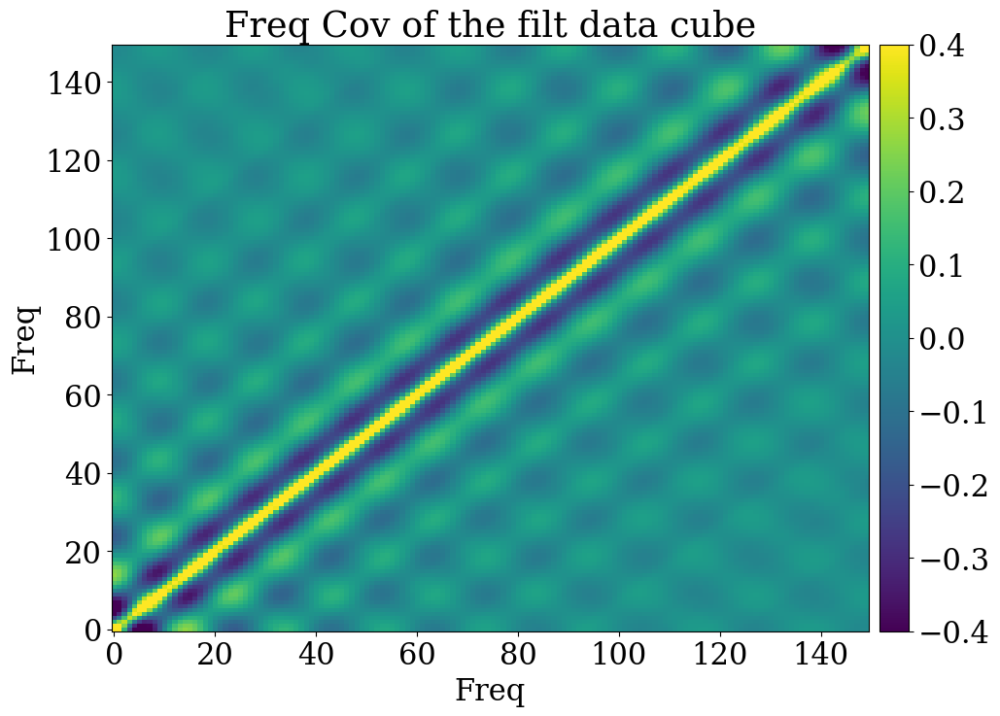

In [30]:
fig = plt.figure(figsize=(12,8),dpi=100)
plt.imshow(Cov_f/Cov_f.max(),vmin = -0.4,vmax=0.4, origin='lower', aspect='auto')
plt.colorbar(pad=0.012)
plt.title('Freq Cov of the filt data cube')
plt.xlabel('Freq')
plt.ylabel('Freq')

In [31]:
fg_modes.shape

(15, 2048, 2048)

In [249]:
# # plot the FG modes 
# ext=(RA[0],RA[-1], DEC[0], DEC[-1])
# imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
#                      extent=ext, cmap='Spectral_r')


# for ii in range(Nfg):
#     plt.figure(figsize=(10,6),dpi=100)
#     im = plt.imshow(fg_modes[ii,:,:],**imshow_kwargs)
#     plt.xlabel("RA [deg]",fontsize=16)
#     plt.title(f'FG mode : {ii}',fontsize=24)
#     plt.colorbar(orientation='vertical',pad=0.02)

In [32]:
eignumb = np.linspace(1,len(eigval),len(eigval))

Text(0, 0.5, '$\\lambda$')

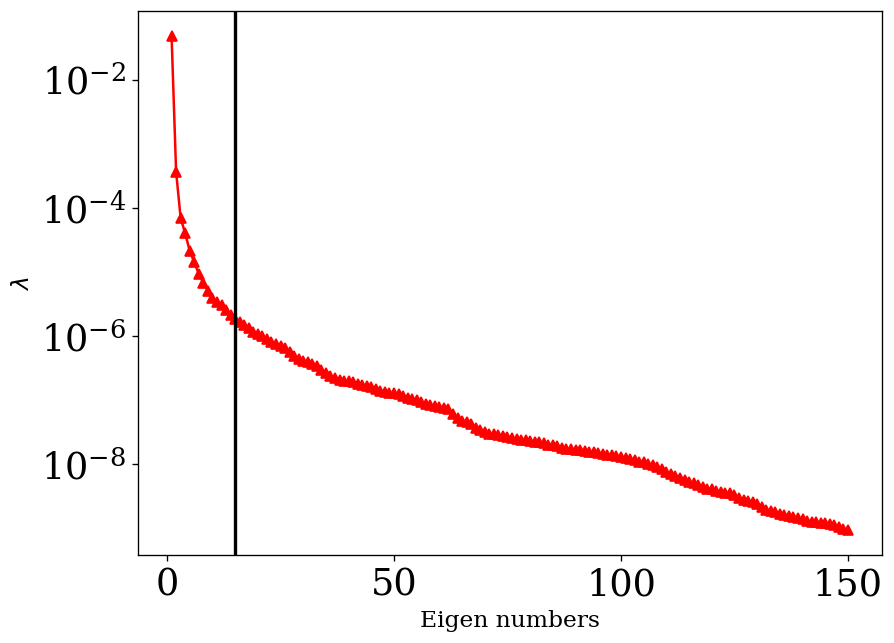

In [33]:
fig, ax = plt.subplots(1, figsize=(8, 6), dpi=120)
ax.plot(eignumb,abs(eigval),marker='^',color='red')
plt.axvline(Nfg,linestyle='-', linewidth='2',color='black')

ax.set_yscale('log')
ax.set_xlabel(r'Eigen numbers',fontsize=14)
ax.set_ylabel(r'$\lambda$',fontsize=14)
# ax.set_xlim([0,200])
# ax.set_ylim([1e-8,1e2])

([], [])

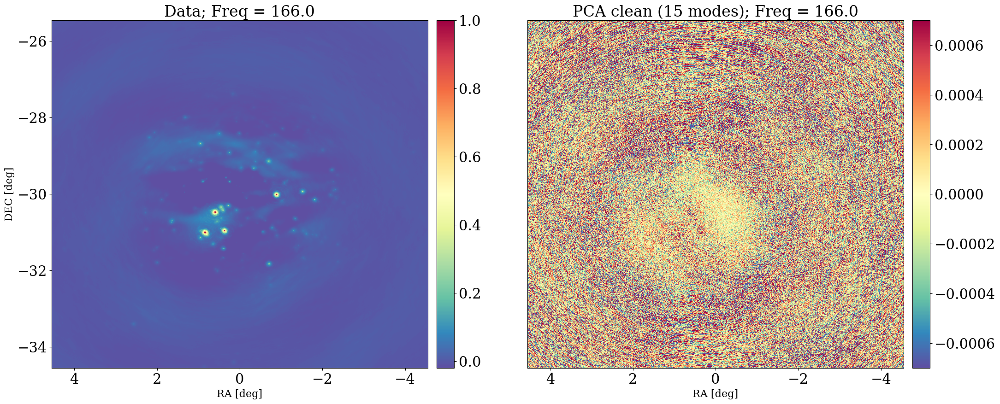

In [41]:
ext=(RA[0],RA[-1], DEC[0], DEC[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext,)


fig = plt.figure(num=1, figsize=(26, 10), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.imshow(image[nu_id,:,:],vmin=-0.02,vmax=1.0,**imshow_kwargs,cmap='Spectral_r')
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Data; Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)


plt.subplot(gspec[0, 1])
plt.imshow(clean_cube_pca[nu_id,:,:],vmin=-7e-4,vmax=7e-4,**imshow_kwargs,cmap='Spectral_r')
plt.xlabel("RA [deg]",fontsize=16)
plt.title(f'PCA clean ({Nfg} modes); Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)
plt.yticks([])

In [250]:
# ext=(RA[0],RA[-1], DEC[0], DEC[-1])
# imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
#                      extent=ext,)


# fig = plt.figure(num=1, figsize=(26, 10), dpi=100)

# gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
# plt.subplot(gspec[0, 0])
# plt.imshow(image[nu_id,:,:],vmin=-0.02,vmax=1.0,**imshow_kwargs,cmap='Spectral_r')
# plt.xlabel("RA [deg]",fontsize=16)
# plt.ylabel('DEC [deg]',fontsize=16)
# plt.title(f'Data; Freq = {freq[nu_id]/1e6}',fontsize=24)
# plt.colorbar(orientation='vertical',pad=0.02)


# plt.subplot(gspec[0, 1])
# plt.imshow(fg_map[nu_id,:,:],vmin=-0.02,vmax=1.0,**imshow_kwargs,cmap='Spectral_r')
# plt.xlabel("RA [deg]",fontsize=16)
# plt.title(f'FG map; Freq = {freq[nu_id]/1e6}',fontsize=24)
# plt.colorbar(orientation='vertical',pad=0.02)
# plt.yticks([])

# Load the primary beam 

In [42]:
# Load the primary beam 
path = '/project/def-mdobbs/arnab92/SKAD3/data/beam_Sub_bands'
beam = os.path.join(path,'SKA_beam_sub_5_166_180.9_MHz.fits')

In [43]:
hdu_beam = fits.open(beam)[0]

In [44]:
hdr_beam = hdu_beam.header

In [45]:
# hdr_beam

In [46]:
nfreq_beam = hdr_beam['NAXIS3']

In [47]:
beam = np.array(hdu_beam.data[:])

In [48]:
beam.shape,image.shape

((150, 2560, 2560), (150, 2048, 2048))

# Now take the beam of same shape as image
# Note that, the primary beam image is larger than the actual image

In [49]:
im_size_deg = abs(hdr['CDELT1']) * Nx # image size in deg
im_size_deg

9.102222222222213

In [50]:
# Make the beam image same as data image
theta_fov = im_size_deg # deg
res = abs(np.radians(hdr_beam['CDELT1']))
fov = np.radians(theta_fov)
fov_sin = 2 * np.sin(fov / 2.)

In [51]:
n = fov_sin / res
idx = int((beam.shape[1] - n) / 2.)-1
idx

256

In [52]:
# Trimmed central 4deg map
pb_map = beam[:, idx:-idx, idx:-idx]

In [53]:
pb_map.shape

(150, 2048, 2048)

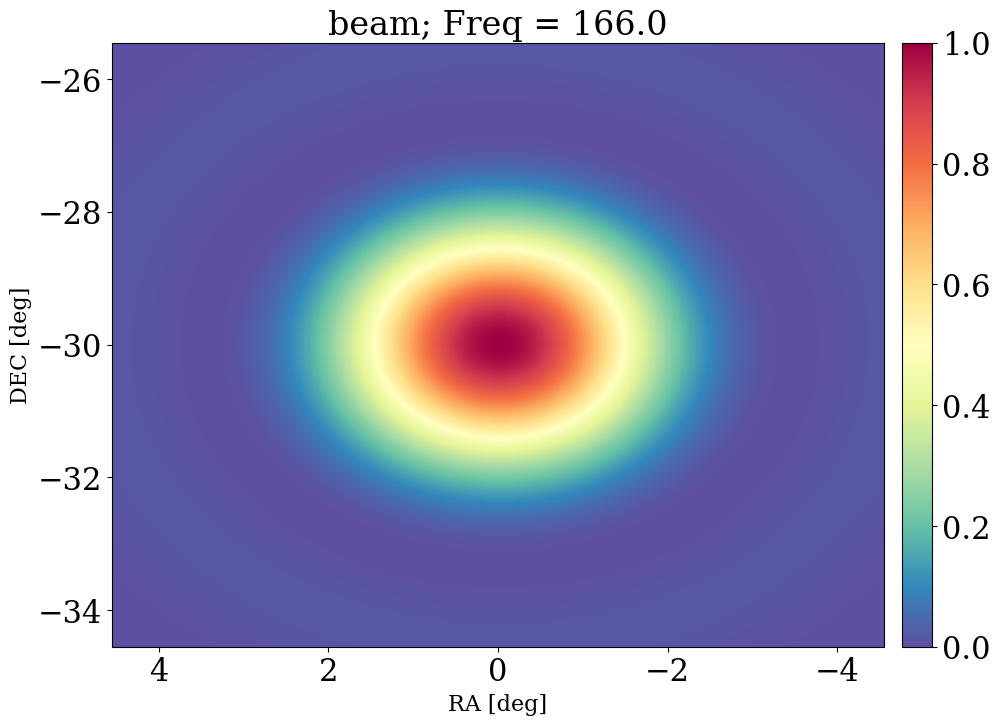

In [54]:
ext=(RA[0],RA[-1], DEC[0], DEC[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                    extent=ext,  cmap='Spectral_r')

plt.figure(figsize=(12,8),dpi=100)
nu_id = 0
im = plt.imshow(pb_map[nu_id,:,:],**imshow_kwargs,vmin=0,vmax=1)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'beam; Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)

In [55]:
# Do the PB correction by dividing the beam
data_pb = np.divide(image,pb_map)
data_filt_pb = np.divide(clean_cube_pca,pb_map)

([], [])

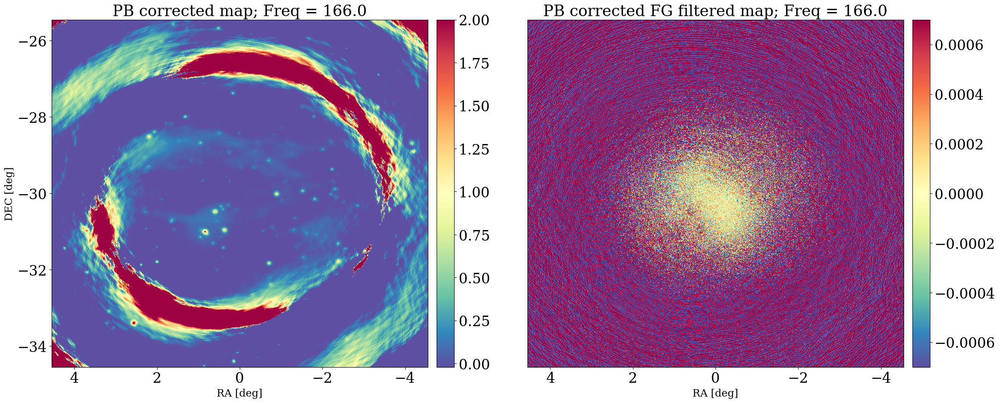

In [56]:
ext=(RA[0],RA[-1], DEC[0], DEC[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext, cmap='Spectral_r')


fig = plt.figure(num=1, figsize=(26, 10), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.imshow(data_pb[nu_id,:,:],vmin=-0.02,vmax=2.0,**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'PB corrected map; Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)


plt.subplot(gspec[0, 1])
plt.imshow(data_filt_pb[nu_id,:,:],vmin=-7e-4,vmax=7e-4,**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.title(f'PB corrected FG filtered map; Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)
plt.yticks([])

In [57]:
# Take the central 2 deg of the pb_corrected image 
theta_fov = 2 # deg
res = abs(np.radians(hdr['CDELT1']))
fov = np.radians(theta_fov)
fov_sin = 2 * np.sin(fov / 2.)
n = fov_sin / res
idx = int((Nx - n) / 2.)

cart_map = data_pb[:, idx:-idx, idx:-idx]
cart_map_filt = data_filt_pb[:, idx:-idx, idx:-idx]

In [58]:
# The 2 deg RA and DEC range
ra = RA[idx:-idx]
dec = DEC[idx:-idx]

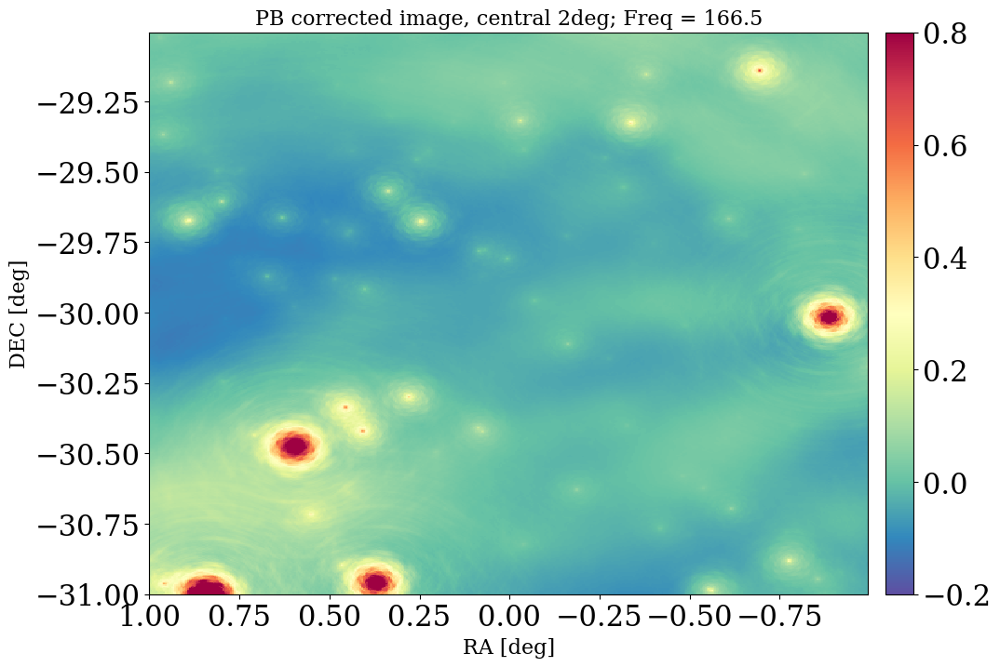

In [59]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext, cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map[nu_id,:,:],vmin=-0.2,vmax=0.8,**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'PB corrected image, central 2deg; Freq = {freq[nu_id]/1e6}',fontsize=16)
plt.colorbar(orientation='vertical',pad=0.02)

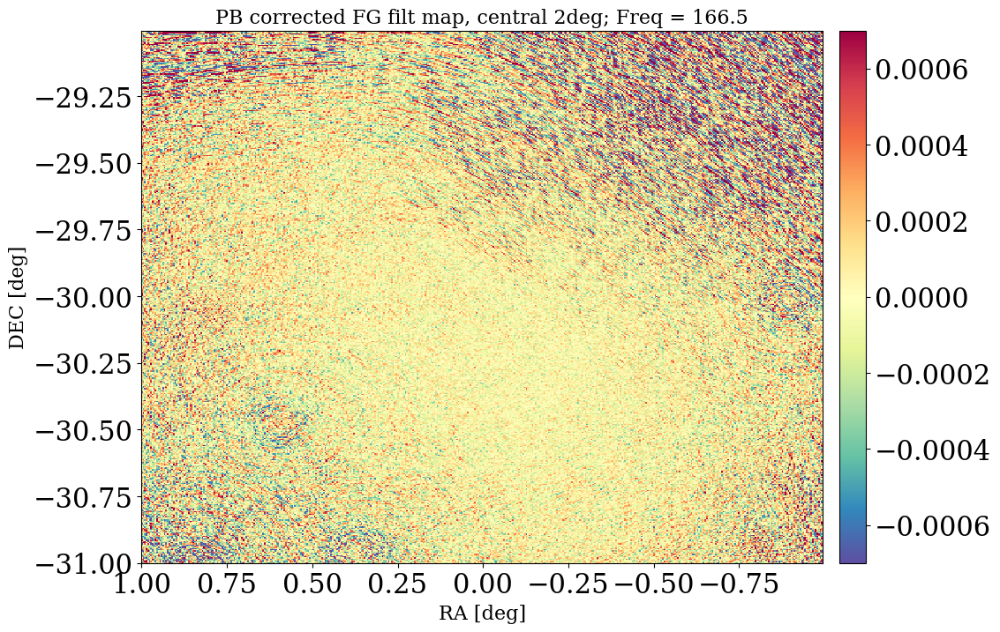

In [60]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext, cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map_filt[nu_id,:,:],vmin=-7e-4,vmax=7e-4,**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'PB corrected FG filt map, central 2deg; Freq = {freq[nu_id]/1e6}',fontsize=16)
plt.colorbar(orientation='vertical',pad=0.02)

# Jy/beam to kelvin conversion

In [61]:
# Central freq and redshift
nu_c = freq[int(freq.size/2.0)]/1e6 # in MHz
print(f'The central freq is {nu_c} MHz')

wl = c/(nu_c*1e6) # nu_c is the freq of the map in MHz
print(f'The wavelength :  {wl} m')

redshift = f21.value/nu_c - 1
print('Redshift = ',redshift)

The central freq is 173.5 MHz
The wavelength :  1.7279104207492795 m
Redshift =  7.186776668587896


In [62]:
bl_max = 2500. # Max baseline in m
PSF = wl/bl_max 
PSF_arcsec = np.degrees(PSF) * 3600 # in arcsec
print(f'The PSF size : {PSF_arcsec} arcsec')


The PSF size : 142.56284325927555 arcsec


In [63]:
omega_psf = (np.pi * PSF_arcsec**2)/((4*np.log(2)))# Bmaj=Bmin= PSF_arcsec;beam_area = (pi * Bmaj * Bmin)/(4 * log(2))
omega_psf_sr = (omega_psf*un.arcsec**2).to('sr')
print(f'PSF area ={omega_psf_sr}')


PSF area =5.412860698941146e-07 sr


In [64]:
jybeam2k_factor = jy_per_beam_to_kelvin(freq/1e6,omega_psf_sr)
print(f'The mean conversion factor from Jy/bm to K at this freq is {np.mean(jybeam2k_factor)}')

The mean conversion factor from Jy/bm to K at this freq is 2002.4671323973723


In [65]:
# Check using BMAJ and BMIN
bmaj = hdr['BMAJ']
bmin = hdr['BMIN']
omega = np.radians(bmaj) * np.radians(bmin) * np.pi / (4 * np.log(2))
# imager_scale_factor = omega / (res ** 2)
print(omega)

7.862628953750243e-07


In [64]:
# imager_scale_factor = hdr['WSCNORMF']
# res = abs(np.radians(hdr['CDELT1']))
# omega = 1.0 *  res ** 2
# print(omega)

In [65]:
#imager_scale_factor = (Nx * Ny) / hdr['WSCNORMF']

In [66]:
#imager_scale_factor *res ** 2

In [67]:
# jybeam2k_factor = jy_per_beam_to_kelvin(freq/1e6,omega*un.sr)
# print(f'The mean conversion factor from Jy/bm to K at this freq is {np.mean(jybeam2k_factor)}')

In [66]:
# Convert to kelvin 
cart_map_kelvin = cart_map * jybeam2k_factor[:,None,None]
cart_map_filt_kelvin = cart_map_filt * jybeam2k_factor[:,None,None]

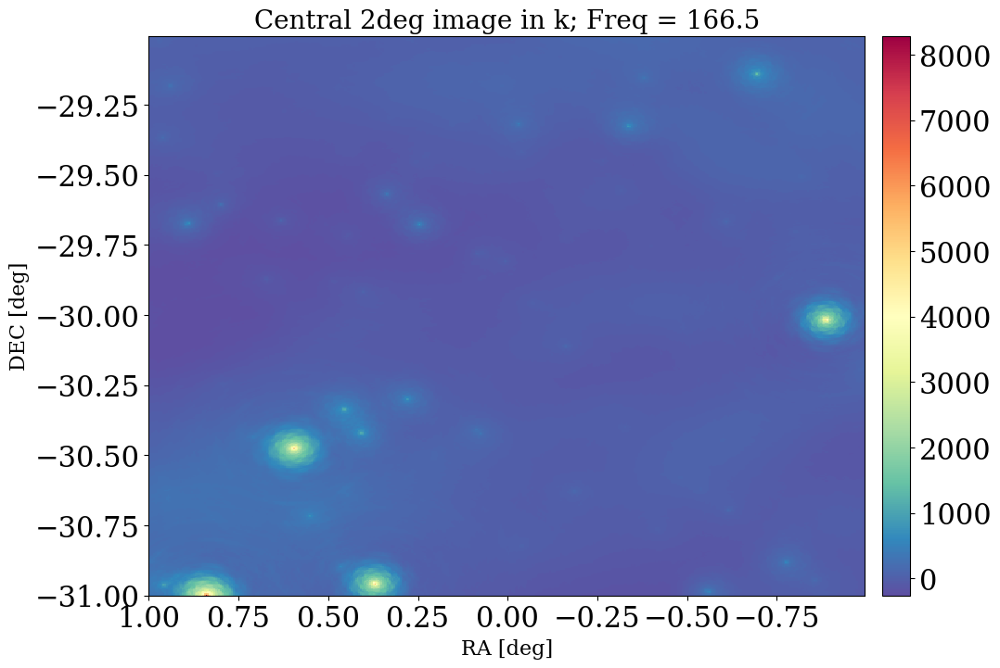

In [67]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext, cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map_kelvin[nu_id,:,:],**imshow_kwargs,)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Central 2deg image in k; Freq = {freq[nu_id]/1e6}',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02)

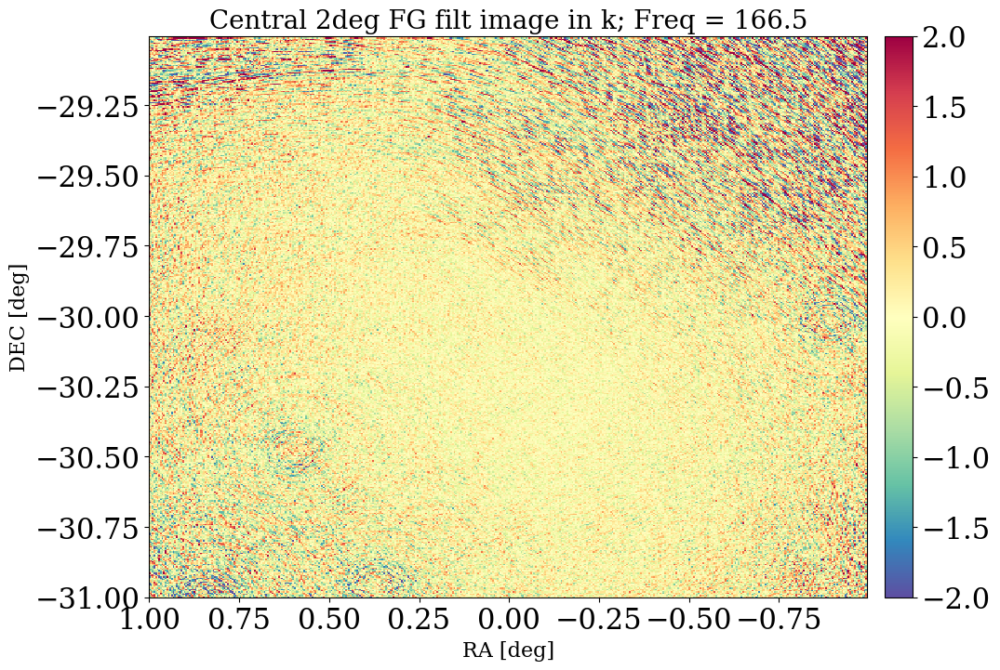

In [68]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext, cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map_filt_kelvin[nu_id,:,:],**imshow_kwargs,vmin=-2,vmax=2)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Central 2deg FG filt image in k; Freq = {freq[nu_id]/1e6}',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02)

# Spatial Fourier Transform

In [69]:
apply_spatial_taper = True

In [70]:
# Transform to vis domain -- data
data_uv_nu = image_to_uv(cart_map_kelvin, window=False,axes=(1,2))
data_filt_uv_nu = image_to_uv(cart_map_filt_kelvin, window=False,axes=(1,2))

Fourier Norm : 4.938271604938272e-06
Fourier Norm : 4.938271604938272e-06


# Delay Transform 

In [71]:
import scipy.signal.windows as windows

In [72]:
apply_spectral_window = True
window_name = 'nuttall'
nfreq= freq.size

In [73]:
if apply_spectral_window:
    
    # Generate a blackmanharris window to apodisation 
    window = windows.get_window(window_name,nfreq)
    w = window[:,np.newaxis,np.newaxis]
    
    data_uv_tau =  np.fft.fftshift(np.fft.ifft(data_uv_nu * w,axis=0),axes=0)    
    data_filt_uv_tau =  np.fft.fftshift(np.fft.ifft(data_filt_uv_nu * w,axis=0),axes=0)    
else:
    data_uv_tau =  np.fft.fftshift(np.fft.ifft(data_uv_nu,axis=0),axes=0)
    data_filt_uv_tau =  np.fft.fftshift(np.fft.ifft(data_filt_uv_nu,axis=0),axes=0)
     

In [74]:
delays = np.fft.fftshift(np.fft.fftfreq(nfreq, d= chan_res)) # * un.s # in s
tau = delays * 1e6 # in mu-s

In [75]:
# Estimating the k-modes ##
theta_res = np.deg2rad(abs(dx)) # pixel res (deg->rad), taking the mean resolution


In [76]:
print(theta_res,res)

7.757018897752568e-05 7.757018897752568e-05


In [77]:
# New shape of the trimmed 2deg image 
nx = data_uv_tau.shape[1]
ny = data_uv_tau.shape[2]

In [78]:
# get the Fourier modes
kx, ky, u, v = get_spatial_kmodes(nx,ny,theta_res,redshift)
k_perp = np.sqrt(kx[:,np.newaxis]**2 + ky[np.newaxis,:] **2)  # [Mpc^-1]

In [79]:
(wl * kperp_to_u(k_perp.max() * un.Mpc**-1,redshift))/1e3

<Quantity 15.75111769>

In [80]:
k_parallel = delay_to_kpara(delays * un.s,redshift,cosmo=cosmo)

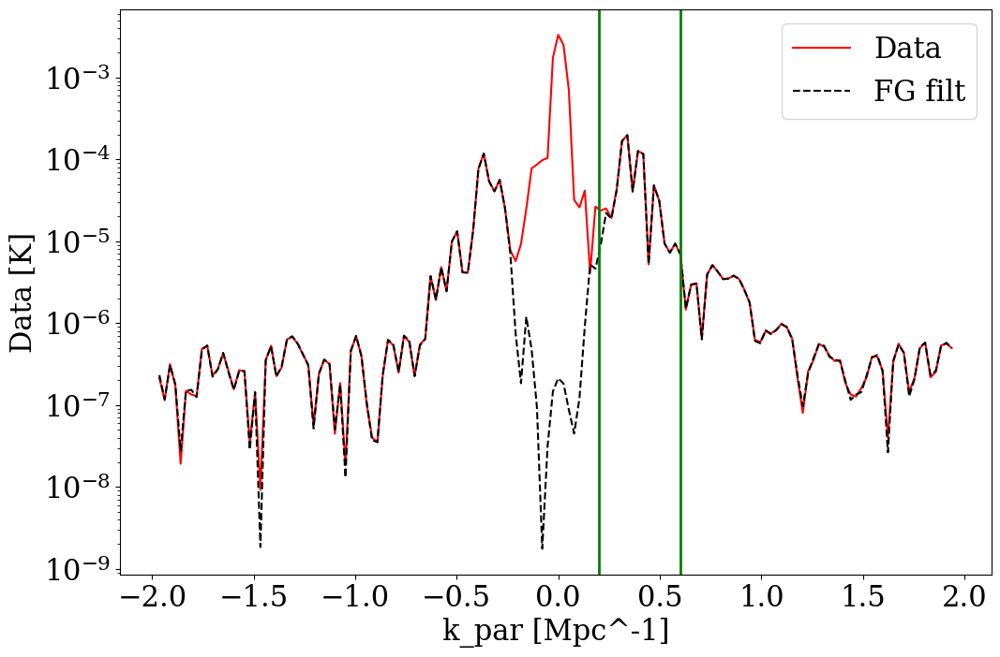

In [81]:
plt.figure(figsize=(12,8),dpi=100)
plt.plot(k_parallel.value, abs(data_uv_tau[:,100,100].real),color='red',label='Data')
plt.plot(k_parallel.value, abs(data_filt_uv_tau[:,100,100].real),color='black',linestyle='--',label='FG filt')

plt.axvline(0.2,lw=2,color='green')
plt.axvline(0.6,lw=2,color='green')
plt.yscale('log')
plt.xlabel(r'k_par [Mpc^-1]')
plt.ylabel(r'Data [K]')
plt.legend()
# plt.axvline(0.2)
#plt.xlim(-2,2)

In [82]:
dfreq = chan_res/1e6 # chan res in MHz
f21.value

1420.405752

In [83]:
# The volume normalization
vol_norm = vol_normalization_vis(Nx = nx, Ny = ny, Nz = nfreq, 
                                      theta_res = theta_res, redshift=redshift,chan_width = dfreq)

Linear size in X-direction = 310.21115772121686 Mpc
Linear size in Y-direction = 310.21115772121686 Mpc
Linear size in Z-direction = 239.8585710317232 Mpc
Power Spectrum normalization factor  value - 23081821.1242121 Mpc^3


In [84]:
# Take the 3D correlation, (auto-ps), and normalize by the volume of the survey. We take the real part only.
data_corr_real = get_ps(data_uv_tau,vis_cube_2=data_uv_tau,vol_norm_factor=(vol_norm))
data_filt_corr_real = get_ps(data_filt_uv_tau,vis_cube_2=data_filt_uv_tau,vol_norm_factor=(vol_norm))

correlate the vis cube 1 with vis cube 2
correlate the vis cube 1 with vis cube 2


In [86]:
tau_id = np.argmin(abs(tau-0.))

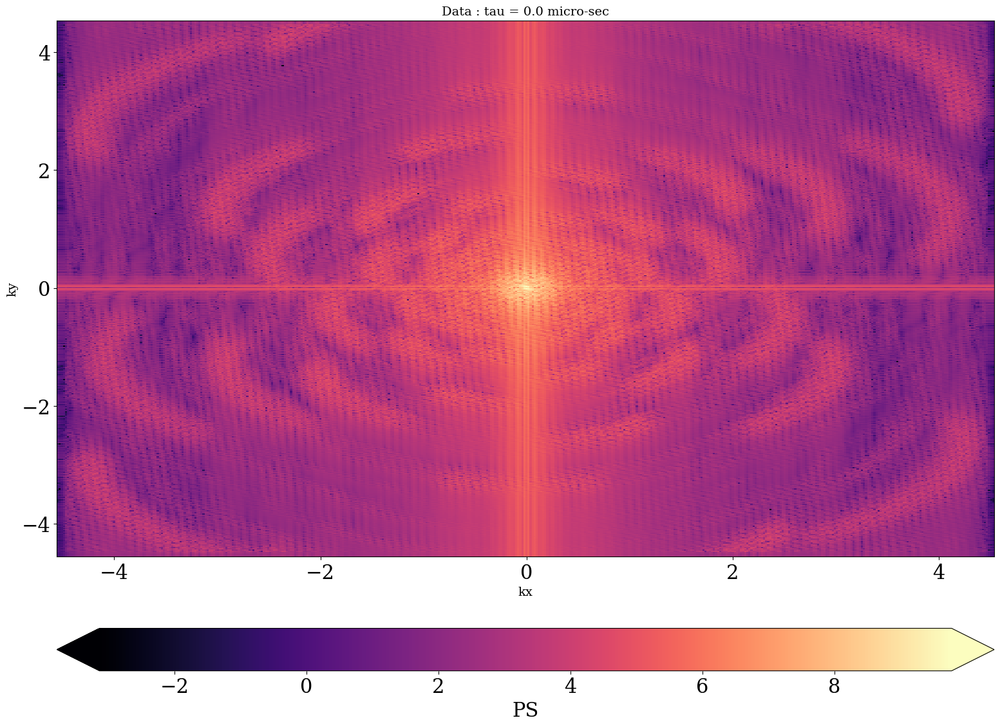

In [87]:
delay_id = tau_id

fig = plt.figure(figsize=(16, 12), dpi=100)

im = plt.imshow(np.log10(data_corr_real[delay_id,:,:]),
                   extent=(kx[0],kx[-1], ky[0], ky[-1]),
                aspect='auto', origin='lower', interpolation='nearest',cmap='magma')
plt.colorbar(im, extend='both',pad=0.1, orientation='horizontal',label='PS')
plt.xlabel(r'kx',fontsize=14)
plt.ylabel(r'ky',fontsize=14)
plt.title(f'Data : tau = {np.round(tau[delay_id],2)} micro-sec',fontsize=14)
# plt.ylim(-2,2)
# plt.xlim(-2,2)
plt.tight_layout()
plt.show()

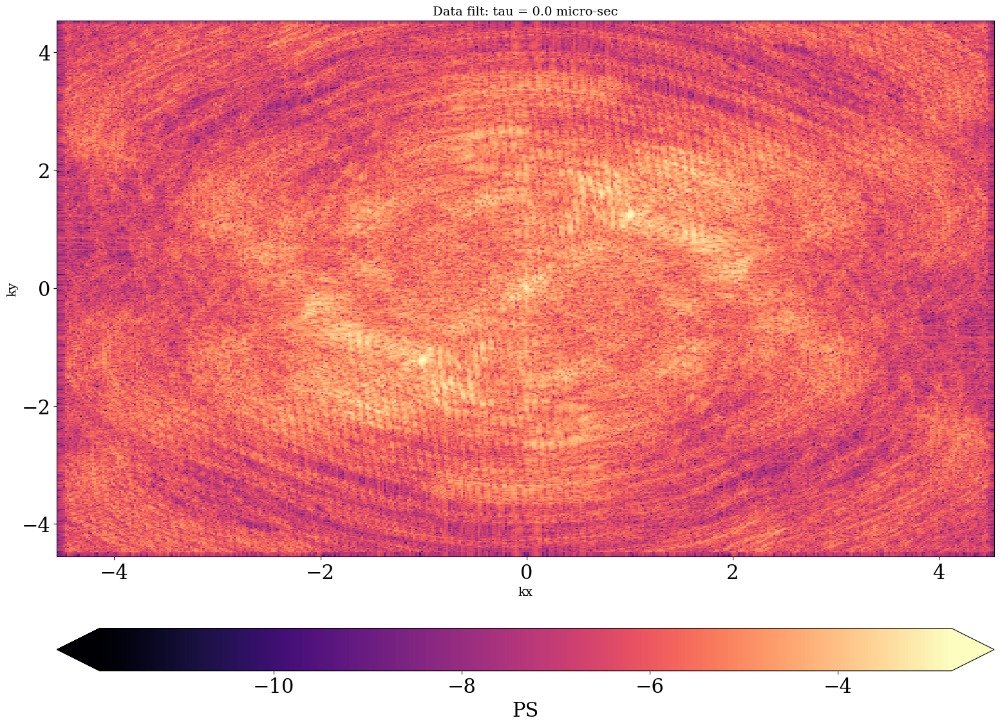

In [88]:
delay_id = tau_id

fig = plt.figure(figsize=(16, 12), dpi=100)

im = plt.imshow(np.log10(data_filt_corr_real[delay_id,:,:]),
                   extent=(kx[0],kx[-1], ky[0], ky[-1]),
                aspect='auto', origin='lower', interpolation='nearest',cmap='magma')
plt.colorbar(im, extend='both',pad=0.1, orientation='horizontal',label='PS')
plt.xlabel(r'kx',fontsize=14)
plt.ylabel(r'ky',fontsize=14)
plt.title(f'Data filt: tau = {np.round(tau[delay_id],2)} micro-sec',fontsize=14)
# plt.ylim(-2,2)
# plt.xlim(-2,2)
plt.tight_layout()
plt.show()

In [89]:
# SKA baselines choice for Power spectrum estimation 
u_min = 40.0 #m
u_max = 1500.0 #m 
u_min_lambda = u_min/wl; u_max_lambda = u_max/wl
kperp_min = u_to_kperp(u_min_lambda,redshift,cosmo=cosmo)
kperp_max = u_to_kperp(u_max_lambda,redshift,cosmo=cosmo)

print(f'Min baseline: {u_min} m, Max baseline: {u_max} m,z: {redshift}, Wavelength:{wl} m')
print(f'Min bl in wavelength unit: {u_min_lambda},Max bl: {u_max_lambda}')
print(f'Min kperp: {kperp_min}, Max kperp: {kperp_max}')   

Min baseline: 40.0 m, Max baseline: 1500.0 m,z: 7.186776668587896, Wavelength:1.7279104207492795 m
Min bl in wavelength unit: 23.149348206751753,Max bl: 868.1005577531907
Min kperp: 0.016366981239636393 1 / Mpc, Max kperp: 0.6137617964863646 1 / Mpc


In [90]:
# keep the non-zero visibilities between minimum and maximum baseline for each delay channel
# also, take the flatten array; i.e, the out put is (ntau,nvis),
# where nvis is number of vis between two limit 

data_corr, uu, vv,  = reshape_data_cube(data_corr_real,u,v,u_min_lambda, u_max_lambda)
data_filt_corr, uu, vv,  = reshape_data_cube(data_filt_corr_real,u,v,u_min_lambda, u_max_lambda)

Gridded data cube shape in kx and ky direction - (450, 450)
Gridded data cube shape in kx and ky direction - (450, 450)


In [91]:
# The true kperp and kpar bins
kperp_bins = np.loadtxt(os.path.join("/project/def-mdobbs/arnab92/SKAD3/test_data","bins_kper.txt"))
kpar_bins = np.loadtxt(os.path.join("/project/def-mdobbs/arnab92/SKAD3/test_data","bins_kpar.txt"))

In [92]:
kperp_bins.min(),kperp_bins.max()

(0.05, 0.5)

# 2D PS for the data 

In [93]:
kperp,kl,ps_2D,ps_2D_w,ps_2D_err  = PS2D(data_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )

Using unit uniform weighting
(2884,)


In [94]:
# With no binning along k_par
k_perp,k_par,ps_2D_no_kpar,_,_ = PS2D_no_kpar_bin(data_corr,weight_cube=None,
                    kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
                    uu=uu,vv=vv,redshift=redshift,fold=True,
                    Nbins_2D=50,log_bins=False)

Using unit uniform weighting
Using linear binning in k_perp between 0.016366981239636393 and 0.6137617964863646
(2884,)


# 2D PS for the PCA cleaned cube

In [95]:
kperp,kl,ps_filt_2D,ps_filt_2D_w,ps_filt_2D_err  = PS2D(data_filt_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )

Using unit uniform weighting
(2884,)


In [96]:
k_perp,k_par,ps_filt_2D_no_kpar,_,_ = PS2D_no_kpar_bin(data_filt_corr,weight_cube=None,
                    kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
                    uu=uu,vv=vv,redshift=redshift,fold=True,
                    Nbins_2D=50,log_bins=False)

Using unit uniform weighting
Using linear binning in k_perp between 0.016366981239636393 and 0.6137617964863646
(2884,)


In [97]:
kbins = np.sqrt(kl[np.newaxis,:]**2+kperp[:,np.newaxis]**2)
kbins.shape

(10, 10)

<ipython-input-98-35c7f04f50ae>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(kperp, kpar_bins, np.log10((ps_2D*1e6)),cmap = 'Spectral_r')


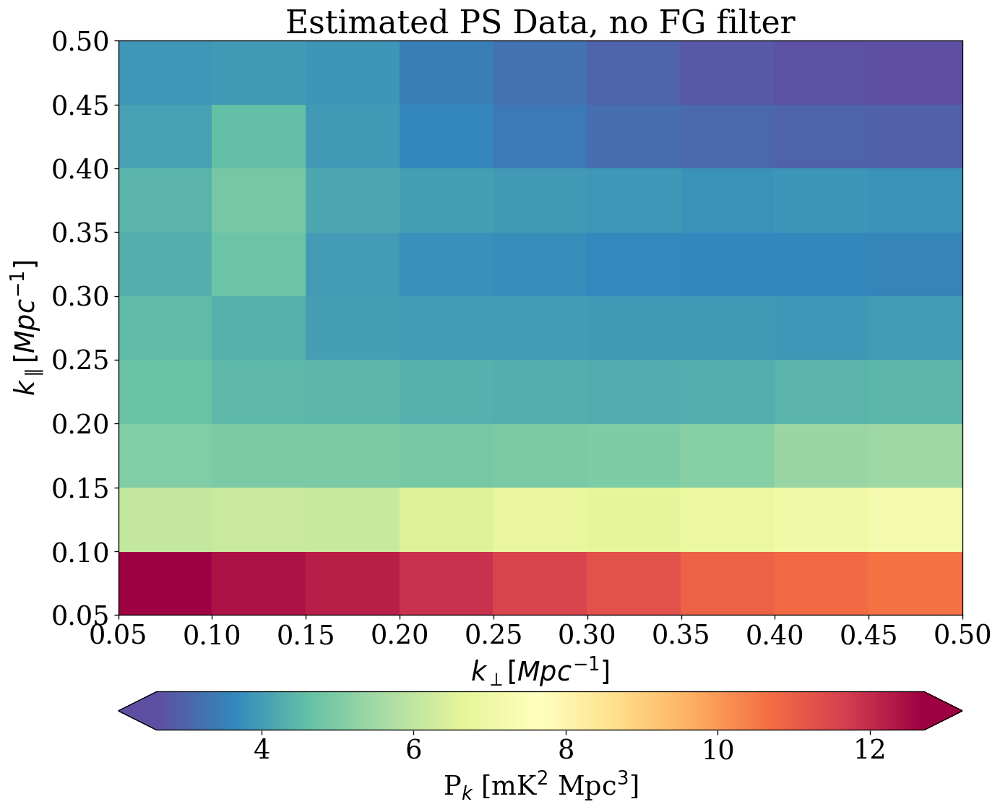

In [98]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(kperp, kpar_bins, np.log10((ps_2D*1e6)),cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
#ax.set_xscale('log')
plt.title('Estimated PS Data, no FG filter')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

<ipython-input-101-889acc6e22ae>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(k_perp, k_par, np.log10((ps_2D_no_kpar*1e6)),vmin=3,vmax=15,cmap = 'Spectral_r')


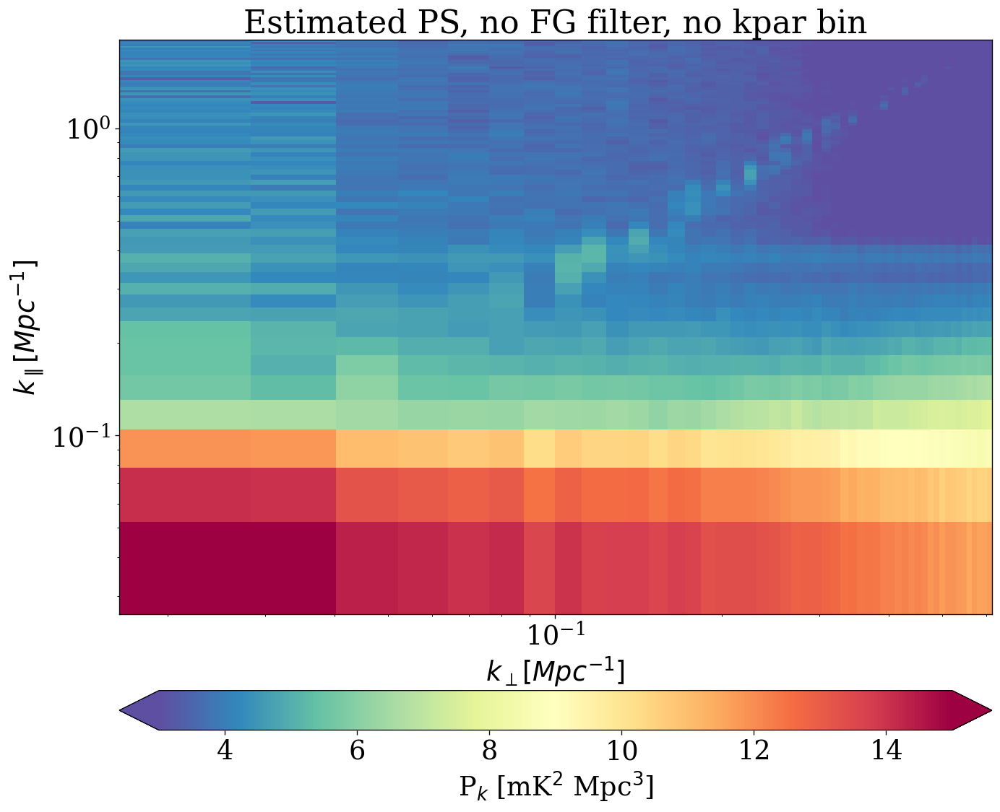

In [101]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(k_perp, k_par, np.log10((ps_2D_no_kpar*1e6)),vmin=3,vmax=15,cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Estimated PS, no FG filter, no kpar bin')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

<ipython-input-104-df20796a34ff>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')


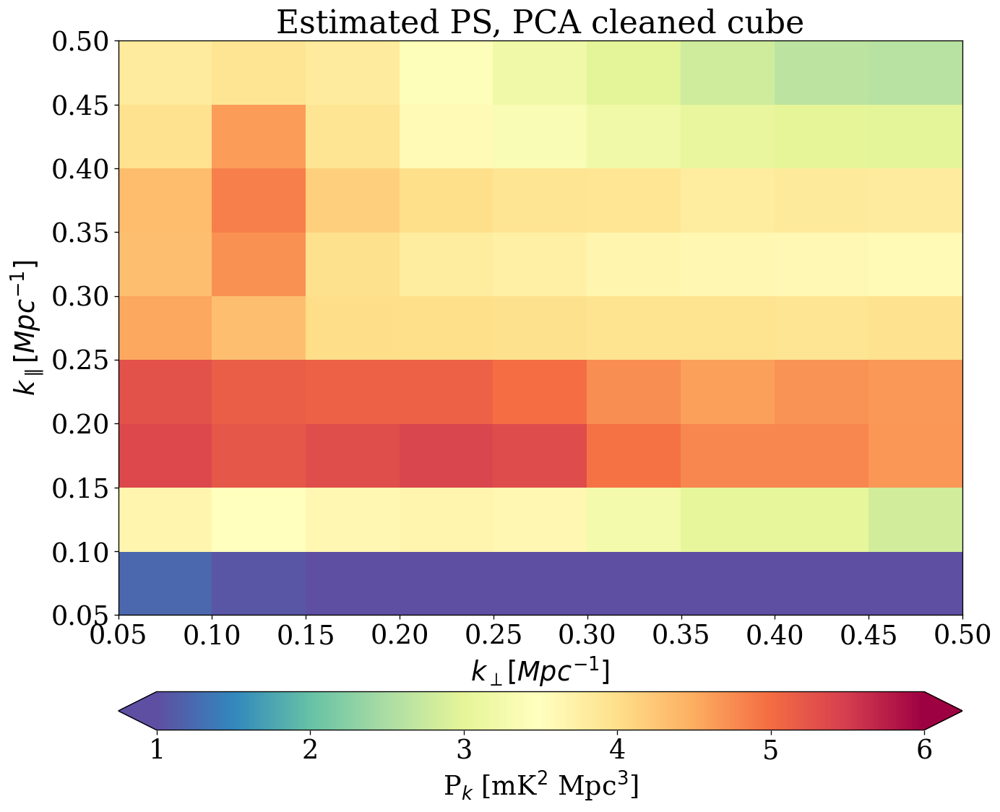

In [104]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
#ax.set_xscale('log')
plt.title('Estimated PS, PCA cleaned cube')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

<ipython-input-103-88cb15e74719>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')


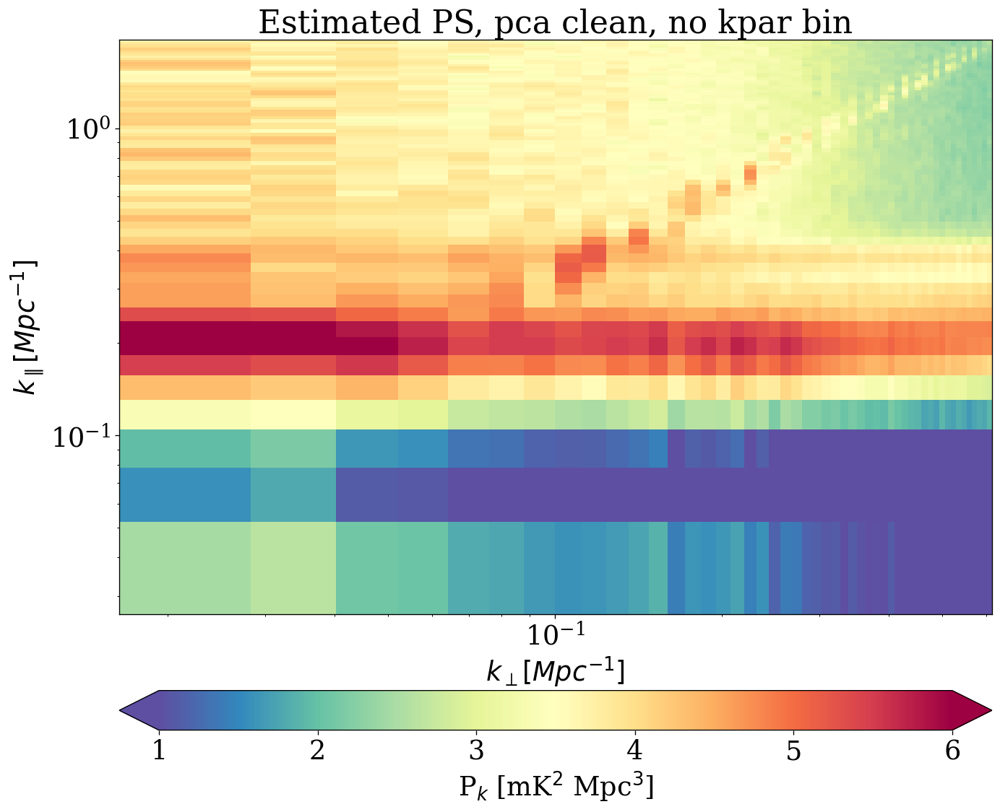

In [103]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()
cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Estimated PS, pca clean, no kpar bin')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

In [105]:
def k_to_delay(k, z, unit=un.Mpc):
    '''Convert delay to inverse co-moving distance in h Mpc^-1 '''
    return k * freqency_to_comoving_distance(z, unit=unit) / (2 * np.pi)

def freqency_to_comoving_distance(z, unit=un.Mpc):
    '''Return frequency to co-moving distance conversion factor'''
    return ((const.c * (1 + z) ** 2) / (cosmo.H(z) * f21)).to(unit * un.Hz ** -1).value 

def delay_to_k(delay, z, unit=un.Mpc):
    '''Convert delay to inverse co-moving distance in h Mpc^-1 '''
    return 2 * np.pi * delay / freqency_to_comoving_distance(z, unit=unit)


In [106]:
tau_horizon = k_to_delay(k_perp,redshift)
kpar_horizon_100ns_buffer = delay_to_kpara((tau_horizon+100e-9) * un.s,redshift).value
kpar_horizon = delay_to_kpara(tau_horizon * un.s,redshift).value


<ipython-input-108-466fb9c76f1b>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')


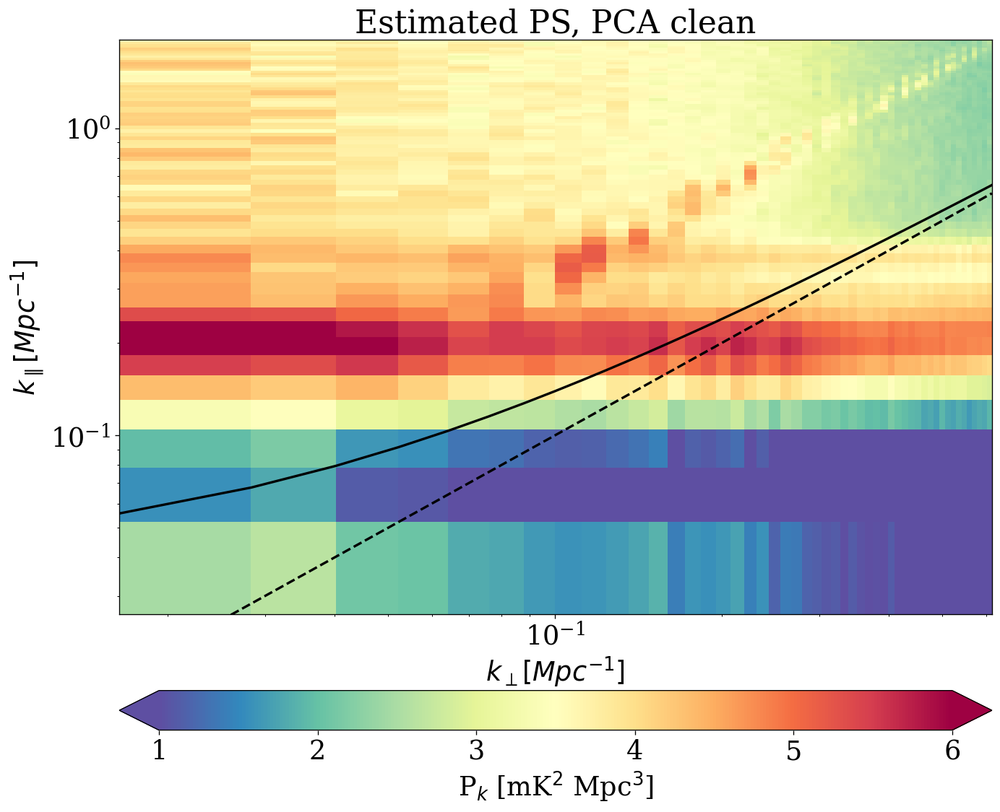

In [108]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')

plt.plot(k_perp,kpar_horizon_100ns_buffer,color='black',lw=2)
plt.plot(k_perp,kpar_horizon,color='black',lw=2,linestyle='--')

cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Estimated PS, PCA clean')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.ylim(k_par.min(),k_par.max())
plt.tight_layout()
plt.show()

In [119]:
# ## Saving the pse ## 
# with h5py.File('/home/arnab92/notebooks/SKAD3/PS2D_166MHz_181MHz_data.h5','w') as hf:
#     PS2D = hf.create_dataset('ps_2D',data=ps2D,shape=ps2D.shape)
#     kperp = hf.create_dataset('k_perp',data=k_perp,shape=k_perp.shape)
#     kpara = hf.create_dataset('k_par',data=k_par,shape=k_par.shape)
#     freq = hf.create_dataset('freq',data=freq_sub,shape=freq_sub.shape)
#     redshit = hf.create_dataset('z',data=redshift)

In [109]:
# True ps 
ps = np.loadtxt(os.path.join("/project/def-mdobbs/arnab92/SKAD3/test_data","TestDatasetTRUTH_166MHz-181MHz.data"))

In [110]:
# kperp_bins = np.loadtxt(os.path.join(path,"bins_kper.txt"))

In [111]:
# kpar_bins = np.loadtxt(os.path.join(path,"bins_kpar.txt"))

<ipython-input-112-99bd4fe06fac>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),cmap = 'Spectral_r')


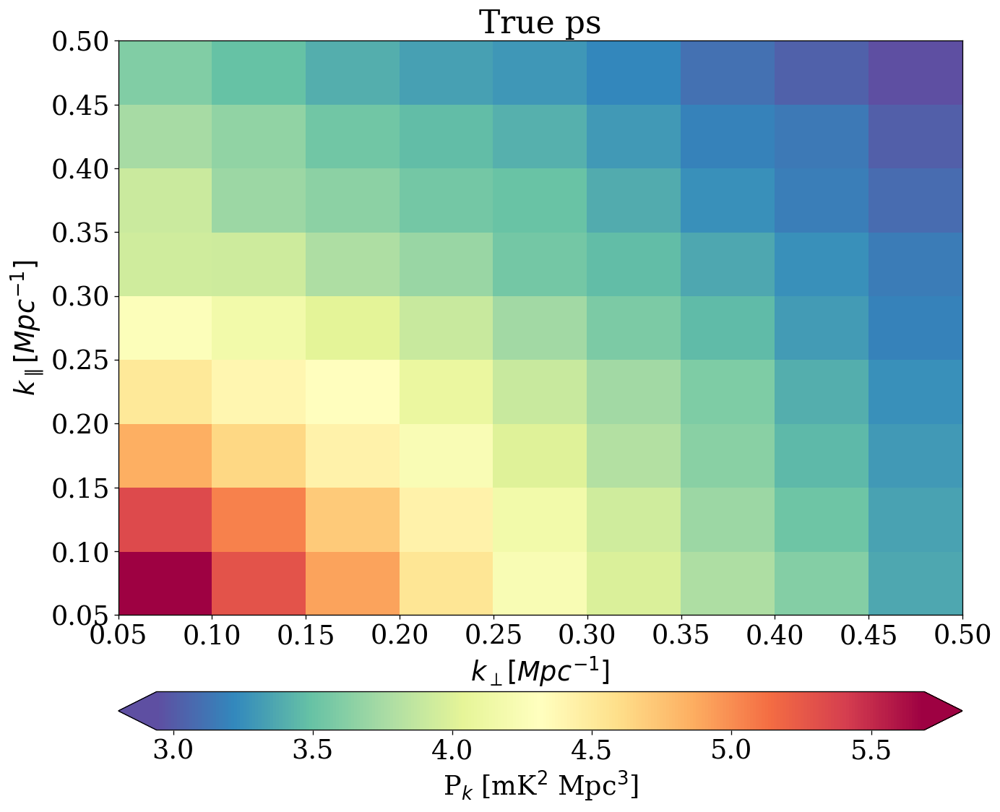

In [112]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
#ax.set_xscale('log')
plt.title('True ps')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

In [113]:
import matplotlib.gridspec as gridspec

<ipython-input-115-b5d10d9bb0be>:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(kperp, kpar_bins, np.log10((ps_2D*1e6)),cmap = 'Spectral_r')
<ipython-input-115-b5d10d9bb0be>:14: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),cmap = 'Spectral_r')


Text(0.5, 1.0, 'True')

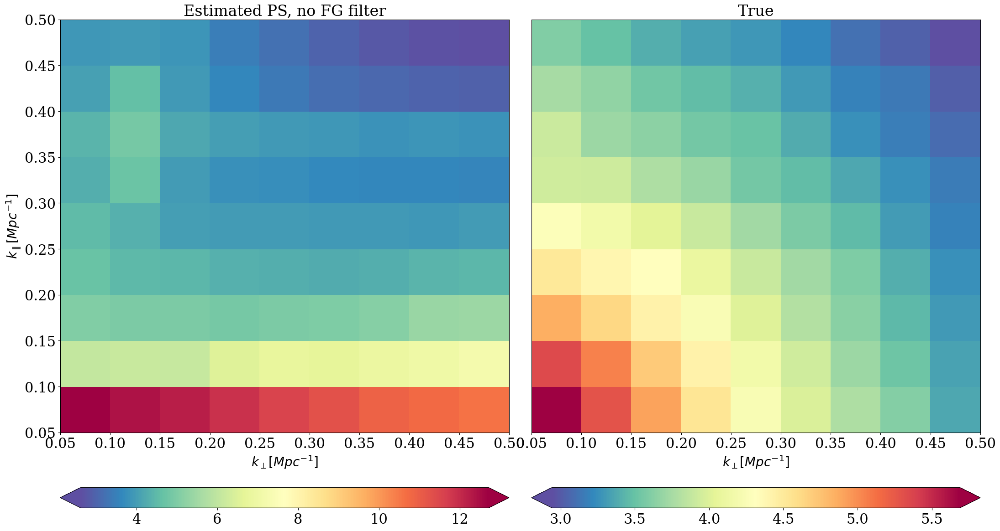

In [115]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp, kpar_bins, np.log10((ps_2D*1e6)),cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, no FG filter',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'True',fontsize=24)


<ipython-input-116-aad7b22751a3>:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=3,vmax=6,cmap = 'Spectral_r')
<ipython-input-116-aad7b22751a3>:14: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),vmin=3,vmax=6,cmap = 'Spectral_r')


Text(0.5, 1.0, 'True')

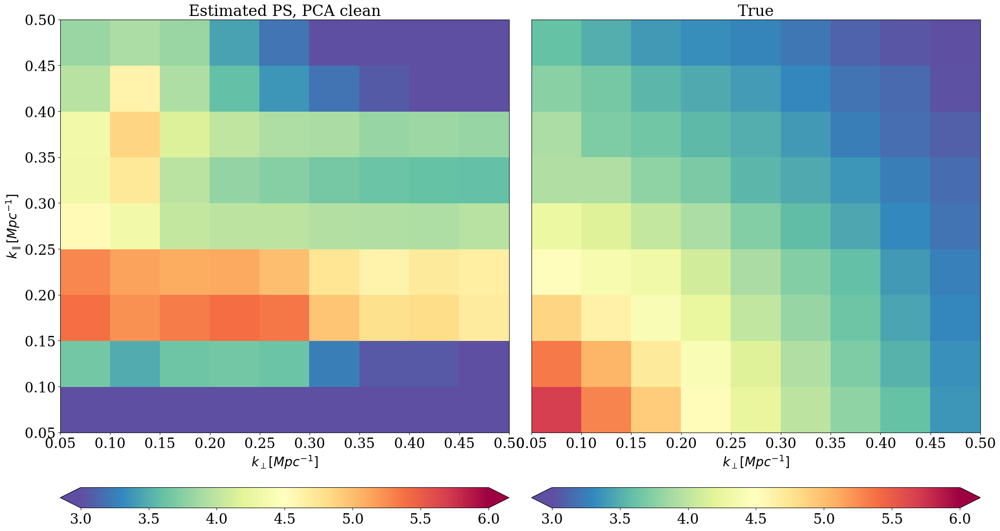

In [116]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=3,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, PCA clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),vmin=3,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'True',fontsize=24)


# GPR implementation

In [117]:
from sklearn.decomposition import FastICA, NMF, KernelPCA, PCA
import GPy

In [118]:
# Convert the Image to Kelvin unit 
data_kelvin = image * jybeam2k_factor[:,None,None]
Im = data_kelvin.reshape(nfreq,Nx * Ny)
print(Im.shape)
data_cov = np.cov(Im)

(150, 4194304)


Text(0, 0.5, 'Freq')

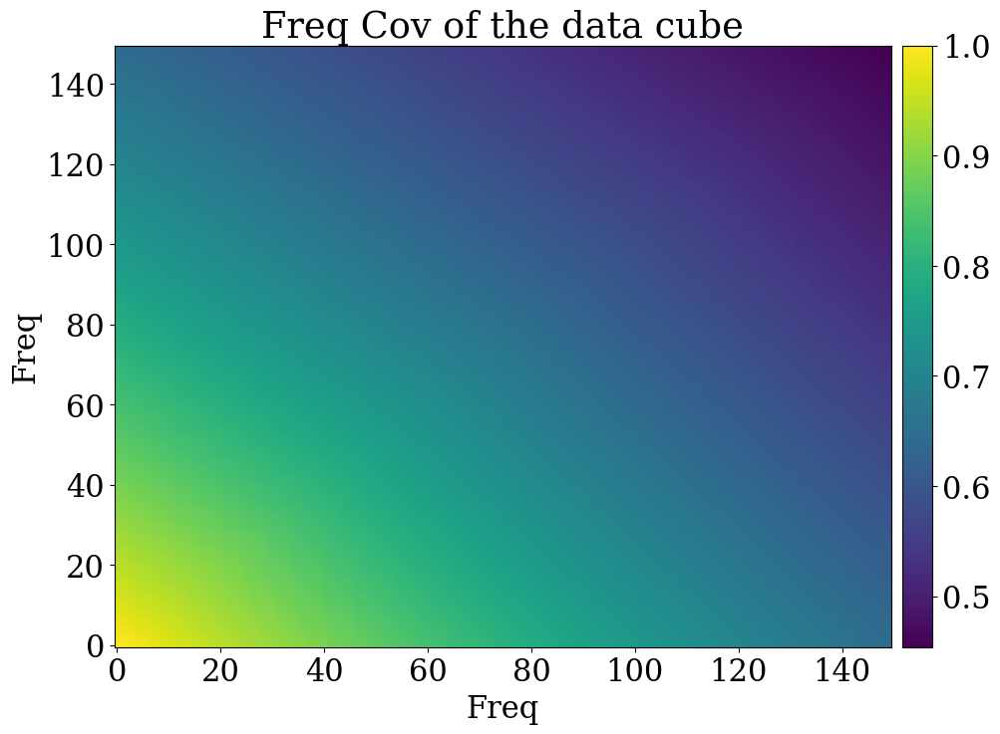

In [119]:
fig = plt.figure(figsize=(12,8),dpi=100)
plt.imshow(data_cov/data_cov.max(), origin='lower', aspect='auto')
plt.colorbar(pad=0.012)
plt.title('Freq Cov of the data cube')
plt.xlabel('Freq')
plt.ylabel('Freq')

In [120]:
data_var = np.var(Im, axis=1)

Text(0.5, 0, 'Frequency [MHz]')

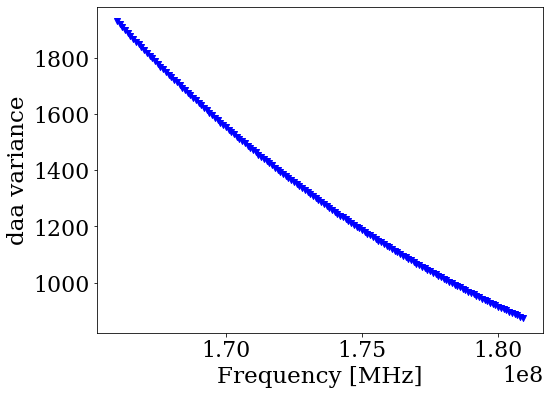

In [121]:
plt.figure(figsize=(8,6))
plt.scatter(freq, data_var, c='blue', marker='v')
plt.ylabel('daa variance', fontsize=23)
plt.xlabel('Frequency [MHz]', fontsize=23)

In [186]:
def gpr_fg_clean(data_cube, freqs, k_fg_sky, k_HI, num_restarts=10,
             nPCA=0, noise_data=None, zero_noise=False, heteroscedastic=False, invert=False, num_processes=1,
             include_HI_kern=True):
    '''
    Runs foreground clean on IM data using GPR.
    ---------
    Arguments
    ---------
    
    data_cube: data cube to be cleaned, in [Nfreq,Nx,Ny] where Nfreq is the frequency direction
    
    freqs: array of frequency range of data of shape Nfreq in MHz
    
    k_fg_sky, k_HI: choice of foreground and 21cm kernels (can be a sum or product of different kernels)
    
    num_restarts: how many times to optimise the GPR regression model.
        [NOTE: If you already know your best fitting kernels (i.e., you're inputting the already
        optimized k_FG and k_21cm kernels), set num_restarts = 0]
        
    nPCA: 0 if no pre-PCA is desired, otherwise this number is the N_FG number of components used
        in a pre-PCA clean of the data
    
    noise_data: input here your noise map in [Nfreq,Nx,Ny] if you have a reasonable estimate from your data, 
        otherwise set to None and use GPR to try to fit your noise
        
    zero_noise: if True, the noise in your GPR model will be set to zero and fixed. Otherwise it will try to
        fit to noise in your data, in either the heteroscedastic or non-heteroscedastic case. Set to zero if 
        you want to fit your noise with a separate kernel instead, otherwise you will fit to noise twice.
        
    heteroscedastic: if True, runs Heteroscedastic regression model (variable noise)
        (Note: you cannot have zero_noise=False and heteroscedastic=True at the same time, set 
        heteroscedastic=False instead in this case).
        
    invert: if True, inverts data in the frequency direction
    num_processes = Number of Processes to use in parallel
    '''
    axes = np.shape(data_cube)
    
    # if desired, do a pre-PCA with nfg=nPCA removed components
    if nPCA > 0: 
        print(f'Doing PCA clean first using {nPCA} FG modes')
        data_cube, _,_,_,_,_ = pca_fg_filter(data_cube, nfg=nPCA)
    
    # converting [Nfreq,Nx,Ny] -> [Nfreq,Npix]
    Input = data_cube.reshape(axes[0],axes[1]*axes[2])
    if noise_data is not None: noise_data = noise_data.reshape(axes[0],axes[1]*axes[2])
    
    # invert frequency axis
    if invert==True: 
        Input = Input[::-1,:]
        freqs = freqs[::-1]  # inverting the freq axis. CHIME data is in decreasing freq order.
        if noise_data is not None: noise_data = noise_data[::-1,:]
    
    # build your model, input the freq range, the data, and the kernels
    if include_HI_kern:
        kern = k_fg_sky + k_HI
    else:
        kern = k_fg_sky
        
    # this heteroscedastic case assumes a Gaussian noise variance that changes with frequency
    if heteroscedastic==True: 
        # this case assumes noise is known, sets noise level to your noise_data variances
            # at different frequencies (since heteroscedastic)
        if noise_data is not None:
            model = GPy.models.GPHeteroscedasticRegression(freqs[:, np.newaxis], Input, kern)
            model.het_Gauss.variance.constrain_fixed(noise_data.var(axis=1)[:, None])
        # this case assumes noise is not known, model will fit a variance at each frequency
        else:
            model = GPy.models.GPHeteroscedasticRegression(freqs[:, np.newaxis], Input, kern)
        # note: if you want the case of *no noise*, there's no need to use heteroscedastic,
            # so set heteroscedastic = False and see below
    
    # this non-heteroscedastic case assumes constant Gaussian noise variance throughout frequency
    else: 
        # this case assumes noise is know, sets the noise variance level to the variance
            # from the input noise_data
        if noise_data is not None:
            model = GPy.models.GPRegression(freqs[:, np.newaxis], Input, kern)
            model.Gaussian_noise.constrain_fixed(noise_data.var())
        else:
            # this case assumes there is no noise in your data
            if zero_noise == True:
                model = GPy.models.GPRegression(freqs[:, np.newaxis], Input, kern)
                model['.*Gaussian_noise'] = 0.0
                model['.*noise'].fix()
            # this case assumes there is noise but it is unknown, fits a constant variance
            else:
                model = GPy.models.GPRegression(freqs[:, np.newaxis], Input, kern)
    
    # optimise model, find best fitting hyperparameters for kernels
    model.optimize_restarts(num_restarts=num_restarts, verbose=True, 
                            num_processes=num_processes, parallel=num_processes > 1)
    
    # extract optimised foreground kernel (depending on how many kernels were considered)
    if k_fg_sky.name == 'sum':
        k_FG_len = len(k_fg_sky.parts)
        print(f'FG kernels length {k_FG_len}')
        k_fg_sky = model.kern.parts[0]
        if k_FG_len > 1:
            for i in range(1, k_FG_len):
                k_fg_sky += model.kern.parts[i]
    else: k_fg_sky = model.kern.parts[0]
    print(f'The foreground kernels are {k_fg_sky}')
    
    # make prediction of what FGs would look like using this optimised FG kernel
    fg_fit, fg_cov = model.predict(freqs[:, np.newaxis], full_cov=True, kern=k_fg_sky,
        include_likelihood=False)
    
    # subtract FG fit from data, to obtain HI residuals:
    gpr_res = Input - fg_fit
    
    # un-revert frequency axis:
    if invert==True: 
        gpr_res = gpr_res[::-1,:]
        fg_fit = fg_fit[::-1,:]
    
    # reshape foreground fit
    fg_fit = np.reshape(fg_fit,(axes[0], axes[1], axes[2]))
    
    
    # reshape residuals
    gpr_res = np.reshape(gpr_res,(axes[0], axes[1], axes[2]))
    
    
    # create series as output object
    d = {'res': gpr_res, 'fgcov': fg_cov, 'fgfit': fg_fit, 'model': model}
    result = pd.Series(d)
    
    return result

# Define the GPR kernels 

In [222]:
# kernel for the smooth foreground:
kern_fg_sky = GPy.kern.RBF(1)
kern_fg_mix = GPy.kern.Matern52(1)
kern_fg_ex = GPy.kern.Matern32(1)

# kernel for the HI cosmological signal:
kern_21 = GPy.kern.Exponential(1)

In [223]:
# setting priors for the smooth foreground kernel:
kern_fg_sky.variance.constrain_bounded(1e6,1e12)
kern_fg_sky.lengthscale.constrain_bounded(6,10)

kern_fg_mix.variance.constrain_bounded(1e2,1e4)
kern_fg_mix.lengthscale.constrain_bounded(4,8)

kern_fg_ex.variance.constrain_bounded(1e1,1e2)
kern_fg_ex.lengthscale.constrain_bounded(1.5,2)

# setting priors for the HI kernel:
kern_21.variance.constrain_bounded(1e-4,5e-1)
kern_21.lengthscale.constrain_bounded(0.4,1.5)

reconstraining parameters rbf.variance
reconstraining parameters rbf.lengthscale
reconstraining parameters Mat52.variance
reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat32.variance
reconstraining parameters Mat32.lengthscale
reconstraining parameters Exponential.variance
reconstraining parameters Exponential.lengthscale


In [224]:
# Define the FG kernel, I am not taking the fg_ex kernel here. The FG kernel is just defined by overall smooth
# RBF kernel and the FG mix kernel, which caputre small scale freq structure.
# LOFAR used a third FG excess kernel to reduce the excess variance in their data, but that requires a careful 
# Choice so that we will not get significant signal loss.

kern_fg = kern_fg_sky + kern_fg_mix 

In [225]:
freq_MHz = freq/1e6

In [226]:
# GPR parameteres, all these are defined in the gpr_fg_clean function 

num_restarts = 0 # no optimization restart. To optimize it will take long time
NprePCA = 0
zero_noise = False
heteroscedastic = True
invert = False
num_processes = 1

In [227]:
import time
import pandas as pd

In [228]:
# Now run GPR using RBF kernel + mix
# My implementation of GPR 

t0 = time.time()
gpr_data_cube = gpr_fg_clean(image, freq_MHz,k_fg_sky= kern_fg,k_HI= kern_21, nPCA=NprePCA,
                          num_restarts=num_restarts,noise_data=None, heteroscedastic=heteroscedastic, 
                          zero_noise=zero_noise, invert=invert)
t1 = time.time()
print((t1-t0)/60.)

FG kernels length 2
The foreground kernels are   sum.               |           value  |         constraints         |  priors
  rbf.variance       |  500000500000.0  |  1000000.0,1000000000000.0  |        
  rbf.lengthscale    |             8.0  |          6.0,10.0           |        
  Mat52.variance     |          5050.0  |        100.0,10000.0        |        
  Mat52.lengthscale  |             6.0  |           4.0,8.0           |        
1.7223104000091554


In [229]:
gpr_res_cube = gpr_data_cube.res
fg_cov_cube = gpr_data_cube.fgcov
fg_fit_cube = gpr_data_cube.fgfit
model_cube = gpr_data_cube.model
print(gpr_res_cube.shape)

(150, 2048, 2048)


In [230]:
model_cube

gp.,value,constraints,priors
sum.rbf.variance,500000500000.0,"1000000.0,1000000000000.0",
sum.rbf.lengthscale,8.0,"6.0,10.0",
sum.Mat52.variance,5050.0,"100.0,10000.0",
sum.Mat52.lengthscale,6.0,"4.0,8.0",
sum.Exponential.variance,0.25005,"0.0001,0.5",
sum.Exponential.lengthscale,1.0,"0.4,1.5",
het_Gauss.variance,"(150, 1)",+ve,


([], [])

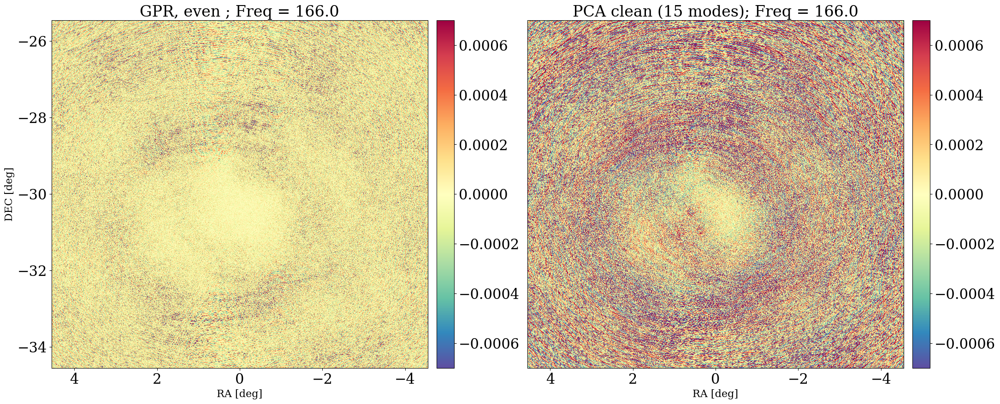

In [231]:
ext=(RA[0],RA[-1], DEC[0], DEC[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext,)

nu_id = 0
fig = plt.figure(num=1, figsize=(26, 10), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.imshow(gpr_res_cube[nu_id,:,:],vmin=-7e-4,vmax=7e-4,**imshow_kwargs,cmap='Spectral_r')
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'GPR, even ; Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)


plt.subplot(gspec[0, 1])
plt.imshow(clean_cube_pca[nu_id,:,:],vmin=-7e-4,vmax=7e-4,**imshow_kwargs,cmap='Spectral_r')
plt.xlabel("RA [deg]",fontsize=16)
plt.title(f'PCA clean ({Nfg} modes); Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)
plt.yticks([])

In [146]:
# from matplotlib.backends.backend_pdf import PdfPages
# pdf_writer = PdfPages('fg_residual_gpr_2_FG_kernel.pdf')

In [147]:
# ext=(RA[0],RA[-1], DEC[0], DEC[-1])
# imshow_kwargs = dict(aspect='auto', origin='lower',vmin=-7e-4,vmax=7e-4, interpolation='nearest', 
#                      extent=ext, cmap='Spectral_r')

# for ii,jj in enumerate(freq):
#     # print(f'freq : freq{jj}, idx :{ii}')
#     fig, ax = plt.subplots(1, figsize=(12, 8), 
#                            dpi=100)

#     gspec = gridspec.GridSpec(1, 1, wspace=0.125)
    
#     # Map-1 XX
#     plt.subplot(gspec[0, 0])
#     plt.imshow(gpr_res_cube[ii,:,:],**imshow_kwargs)
#     plt.ylabel(r'DEC',fontsize=14)
#     plt.xticks([])
#     plt.title(f'freq = {freq[ii]/1e6}',fontsize=14)
#     plt.tight_layout()
#     pdf_writer.savefig(dpi=100, bbox_inches="tight")
#     plt.close()
#     #plt.show()
# pdf_writer.close() 

 <ipython-input-147-ad7561ba275c>:18: UserWarning:This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


Text(0, 0.5, 'Freq')

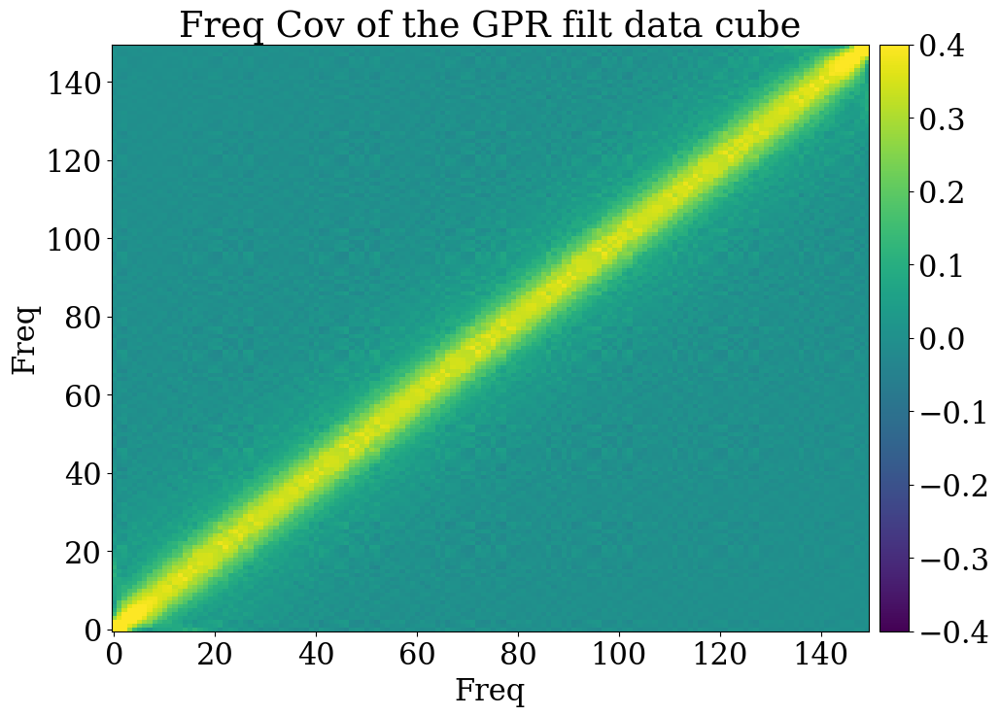

In [232]:
fig = plt.figure(figsize=(12,8),dpi=100)
plt.imshow(fg_cov_cube/fg_cov_cube.max(),vmin = -0.4,vmax=0.4, origin='lower', aspect='auto')
plt.colorbar(pad=0.012)
plt.title('Freq Cov of the GPR filt data cube')
plt.xlabel('Freq')
plt.ylabel('Freq')

In [233]:
data_filt_pb_gpr = np.divide(gpr_res_cube,pb_map)

In [234]:
cart_map_filt_gpr = data_filt_pb_gpr[:, idx:-idx, idx:-idx]

In [235]:
data_filt_pb_gpr.shape

(150, 2048, 2048)

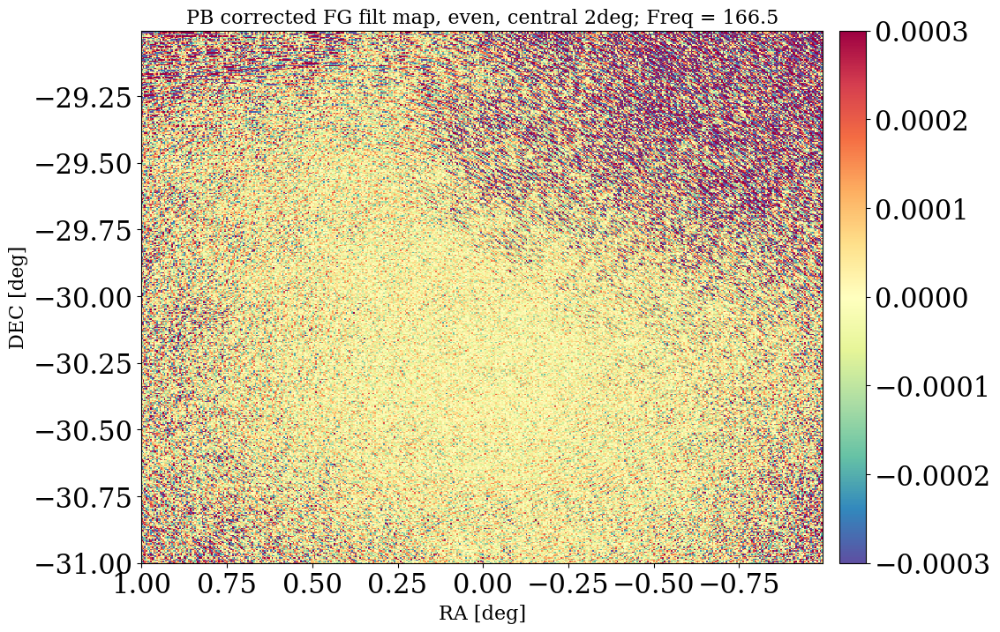

In [236]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest', 
                     extent=ext, cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map_filt_gpr[nu_id,:,:],vmin=-3e-4,vmax=3e-4,**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'PB corrected FG filt map, even, central 2deg; Freq = {freq[nu_id]/1e6}',fontsize=16)
plt.colorbar(orientation='vertical',pad=0.02)

In [237]:
cart_map_filt_gpr_kelvin = cart_map_filt_gpr * jybeam2k_factor[:,None,None]

In [238]:
data_filt_uv_nu_gpr = image_to_uv(cart_map_filt_gpr_kelvin, window=False,axes=(1,2))

Fourier Norm : 4.938271604938272e-06


In [239]:
apply_spectral_window = True
window_name = 'nuttall'
nfreq= freq.size
window = windows.get_window(window_name,nfreq)
w = window[:,np.newaxis,np.newaxis]
data_filt_gpr_uv_tau =  np.fft.fftshift(np.fft.ifft(data_filt_uv_nu_gpr * w,axis=0),axes=0)

In [240]:
data_filt_gpr_corr_real = get_ps(data_filt_gpr_uv_tau,vis_cube_2=data_filt_gpr_uv_tau,vol_norm_factor=(vol_norm))

correlate the vis cube 1 with vis cube 2


In [241]:
data_filt_gpr_corr, uu, vv,  = reshape_data_cube(data_filt_gpr_corr_real,u,v,u_min_lambda, u_max_lambda)

Gridded data cube shape in kx and ky direction - (450, 450)


In [242]:
delays = np.fft.fftshift(np.fft.fftfreq(nfreq, d= chan_res)) # * un.s # in s
tau = delays * 1e6 # in mu-s
k_parallel = delay_to_kpara(delays * un.s,redshift,cosmo=cosmo)

In [243]:
kperp,kl,ps_filt_gpr_2D,_,_  = PS2D(data_filt_gpr_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )

Using unit uniform weighting
(2884,)


In [244]:
k_perp,k_par,ps_filt_gpr_2D_no_kpar,_,_ = PS2D_no_kpar_bin(data_filt_gpr_corr,weight_cube=None,
                    kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
                    uu=uu,vv=vv,redshift=redshift,fold=True,
                    Nbins_2D=50,log_bins=False)

Using unit uniform weighting
Using linear binning in k_perp between 0.016366981239636393 and 0.6137617964863646
(2884,)


 <ipython-input-245-ffee26619966>:6: MatplotlibDeprecationWarning:shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
 <ipython-input-245-ffee26619966>:14: MatplotlibDeprecationWarning:shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


Text(0.5, 1.0, 'Estimated PS, PCA clean')

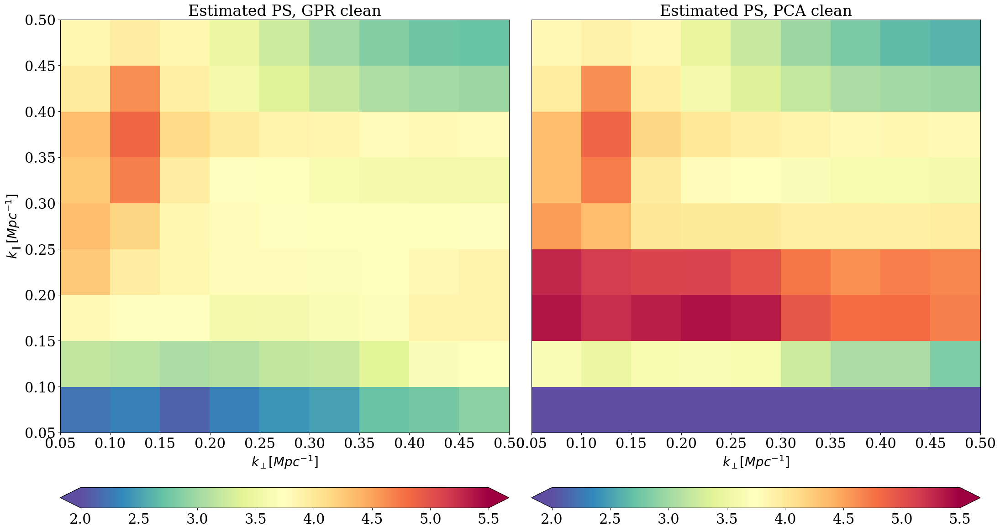

In [245]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_gpr_2D*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, GPR clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, PCA clean',fontsize=24)


 <ipython-input-248-23917e38113a>:6: MatplotlibDeprecationWarning:shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
 <ipython-input-248-23917e38113a>:14: MatplotlibDeprecationWarning:shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


Text(0.5, 1.0, 'True')

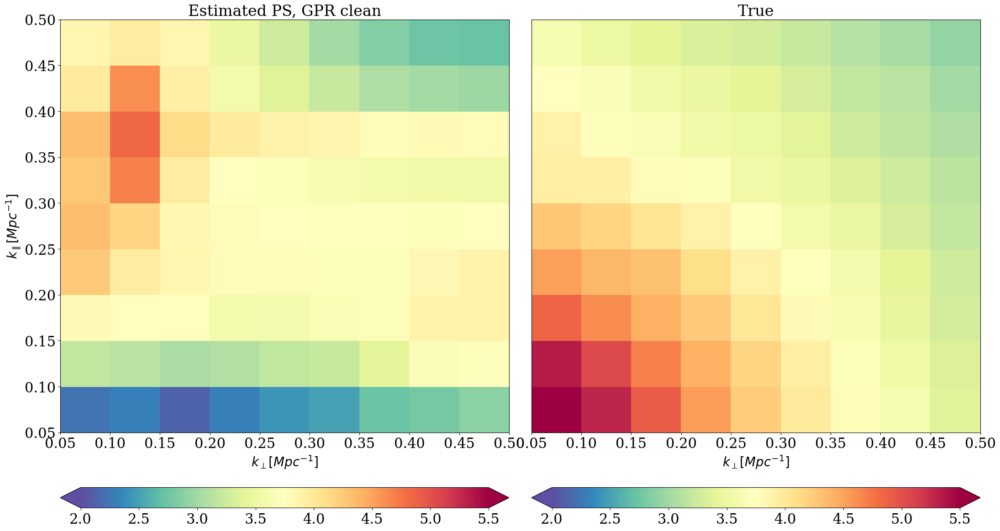

In [248]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_gpr_2D*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, GPR clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'True',fontsize=24)


 <ipython-input-247-2fae99d88e67>:6: MatplotlibDeprecationWarning:shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
 <ipython-input-247-2fae99d88e67>:15: MatplotlibDeprecationWarning:shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


Text(0.5, 1.0, 'Estimated PS, PCA clean')

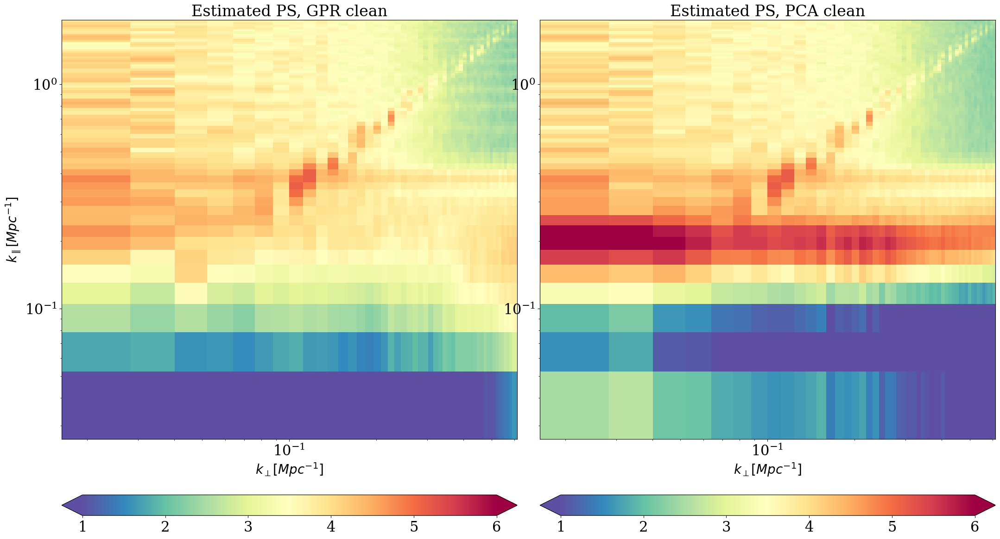

In [247]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)
  
plt.subplot(gspec[0, 0])
plt.pcolormesh(k_perp, k_par, np.log10((ps_filt_gpr_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, GPR clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.xscale('log')
plt.yscale('log')

plt.subplot(gspec[0, 1])
plt.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, PCA clean',fontsize=24)